# Library

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


In [3]:
data = pd.read_csv('./churn_rate_prediction.csv', error_bad_lines = False)
data

<ipython-input-3-bfa9f5000002>:1: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.


  data = pd.read_csv('./churn_rate_prediction.csv', error_bad_lines = False)


,customer_id,Name,age,gender,security_no,region_category,membership_category,joining_date,joined_through_referral,referral_id,...,avg_time_spent,avg_transaction_value,avg_frequency_login_days,points_in_wallet,used_special_discount,offer_application_preference,past_complaint,complaint_status,feedback,churn_risk_score
0,fffe4300490044003600300030003800,Pattie Morrisey,18,F,XW0DQ7H,Village,Platinum Membership,2017-08-17,No,xxxxxxxx,...,300.630000,53005.25,17.0,781.750000,Yes,Yes,No,Not Applicable,Products always in Stock,2
1,fffe43004900440032003100300035003700,Traci Peery,32,F,5K0N3X1,City,Premium Membership,2017-08-28,?,CID21329,...,306.340000,12838.38,10.0,NaN,Yes,No,Yes,Solved,Quality Customer Care,1
2,fffe4300490044003100390032003600,Merideth Mcmeen,44,F,1F2TCL3,Town,No Membership,2016-11-11,Yes,CID12313,...,516.160000,21027.00,22.0,500.690000,No,Yes,Yes,Solved in Follow-up,Poor Website,5
3,fffe43004900440036003000330031003600,Eufemia Cardwell,37,M,VJGJ33N,City,No Membership,2016-10-29,Yes,CID3793,...,53.270000,25239.56,6.0,567.660000,No,Yes,Yes,Unsolved,Poor Website,5
4,fffe43004900440031003900350030003600,Meghan Kosak,31,F,SVZXCWB,City,No Membership,2017-09-12,No,xxxxxxxx,...,113.130000,24483.66,16.0,663.060000,No,Yes,Yes,Solved,Poor Website,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36987,fffe43004900440035003500390036003100,Cuc Tarr,46,F,6F51HFO,NaN,Basic Membership,2017-09-21,No,xxxxxxxx,...,-650.682759,27277.68,6.0,639.510000,No,Yes,Yes,No Information Available,No reason specified,4
36988,fffe43004900440033003500380036003600,Jenni Stronach,29,F,21KSM8Y,Town,Basic Membership,2016-06-27,No,xxxxxxxx,...,-638.123421,11069.71,28.0,527.990000,Yes,No,No,Not Applicable,Poor Customer Service,5
36989,fffe4300490044003500330034003100,Luciana Kinch,23,F,XK1IM9H,NaN,Basic Membership,2016-09-11,Yes,CID3838,...,154.940000,38127.56,Error,680.470000,No,Yes,Yes,Unsolved,Poor Website,4
36990,fffe43004900440031003200390039003000,Tawana Ardoin,53,M,K6VTP1Z,Village,Platinum Membership,2017-06-15,No,xxxxxxxx,...,482.610000,2378.86,20.0,197.264414,Yes,Yes,No,Not Applicable,No reason specified,3


# Analyzing Data

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36992 entries, 0 to 36991
Data columns (total 25 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   customer_id                   36992 non-null  object 
 1   Name                          36992 non-null  object 
 2   age                           36992 non-null  int64  
 3   gender                        36992 non-null  object 
 4   security_no                   36992 non-null  object 
 5   region_category               31564 non-null  object 
 6   membership_category           36992 non-null  object 
 7   joining_date                  36992 non-null  object 
 8   joined_through_referral       36992 non-null  object 
 9   referral_id                   36992 non-null  object 
 10  preferred_offer_types         36704 non-null  object 
 11  medium_of_operation           36992 non-null  object 
 12  internet_option               36992 non-null  object 
 13  l

In [ ]:
data.describe()

,age,days_since_last_login,avg_time_spent,avg_transaction_value,points_in_wallet,churn_risk_score
count,36992.000000,36992.000000,36992.000000,36992.000000,33549.000000,36992.000000
mean,37.118161,-41.915576,243.472334,29271.194003,686.882199,3.463397
std,15.867412,228.819900,398.289149,19444.806226,194.063624,1.409661
min,10.000000,-999.000000,-2814.109110,800.460000,-760.661236,-1.000000
25%,23.000000,8.000000,60.102500,14177.540000,616.150000,3.000000
50%,37.000000,12.000000,161.765000,27554.485000,697.620000,4.000000
75%,51.000000,16.000000,356.515000,40855.110000,763.950000,5.000000
max,64.000000,26.000000,3235.578521,99914.050000,2069.069761,5.000000


In [ ]:
data.describe(include='all')

,customer_id,Name,age,gender,security_no,region_category,membership_category,joining_date,joined_through_referral,referral_id,...,avg_time_spent,avg_transaction_value,avg_frequency_login_days,points_in_wallet,used_special_discount,offer_application_preference,past_complaint,complaint_status,feedback,churn_risk_score
count,36992,36992,36992.000000,36992,36992,31564,36992,36992,36992,36992,...,36992.000000,36992.000000,36992,33549.000000,36992,36992,36992,36992,36992,36992.000000
unique,36992,36992,NaN,3,36992,3,6,1096,3,11359,...,NaN,NaN,1654,NaN,2,2,2,5,9,NaN
top,fffe4300490044003600300030003800,Pattie Morrisey,NaN,F,XW0DQ7H,Town,Basic Membership,2015-06-02,No,xxxxxxxx,...,NaN,NaN,Error,NaN,Yes,Yes,No,Not Applicable,Poor Product Quality,NaN
freq,1,1,NaN,18490,1,14128,7724,55,15839,17846,...,NaN,NaN,3522,NaN,20342,20440,18602,18602,6350,NaN
mean,NaN,NaN,37.118161,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,243.472334,29271.194003,NaN,686.882199,NaN,NaN,NaN,NaN,NaN,3.463397
std,NaN,NaN,15.867412,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,398.289149,19444.806226,NaN,194.063624,NaN,NaN,NaN,NaN,NaN,1.409661
min,NaN,NaN,10.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-2814.109110,800.460000,NaN,-760.661236,NaN,NaN,NaN,NaN,NaN,-1.000000
25%,NaN,NaN,23.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,60.102500,14177.540000,NaN,616.150000,NaN,NaN,NaN,NaN,NaN,3.000000
50%,NaN,NaN,37.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,161.765000,27554.485000,NaN,697.620000,NaN,NaN,NaN,NaN,NaN,4.000000
75%,NaN,NaN,51.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,356.515000,40855.110000,NaN,763.950000,NaN,NaN,NaN,NaN,NaN,5.000000


* Drop customer_id, Name, security_no columns

In [ ]:
data.isnull().sum()

customer_id                        0
Name                               0
age                                0
gender                             0
security_no                        0
region_category                 5428
membership_category                0
joining_date                       0
joined_through_referral            0
referral_id                        0
preferred_offer_types            288
medium_of_operation                0
internet_option                    0
last_visit_time                    0
days_since_last_login              0
avg_time_spent                     0
avg_transaction_value              0
avg_frequency_login_days           0
points_in_wallet                3443
used_special_discount              0
offer_application_preference       0
past_complaint                     0
complaint_status                   0
feedback                           0
churn_risk_score                   0
dtype: int64

In [ ]:
data[data.duplicated()]

,customer_id,Name,age,gender,security_no,region_category,membership_category,joining_date,joined_through_referral,referral_id,...,avg_time_spent,avg_transaction_value,avg_frequency_login_days,points_in_wallet,used_special_discount,offer_application_preference,past_complaint,complaint_status,feedback,churn_risk_score


In [ ]:
! pip install pandas_profiling

In [ ]:
from pandas_profiling import ProfileReport
profile = ProfileReport(data)
profile.to_notebook_iframe()

<ipython-input-15-49b6cf83e689>:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

* Drop columns: customer_id, Name, security_no, referral_id
* Gender: 59 Unknown, not correlate with another columns => mode imputation.
* region_category: missing 5428 => mode imputation.
* joining_date: 1096 distinct values => feature engineering.
* joined_through_referral: 5438? => mode imputation.
* preferred_offer_types: missing 288 => mode imputation.
* medium_of_operation: 14.6% '?' values => replace it by "another".
* last_visit_time => split into 3 session: morning, afternoon, evening => feature engineering.
---
* avg_time_spent: outlier, right-skewed, 1719 negative values =>> impute median

* avg_transaction_value: outlier => impute 5% = median

* avg_frequency_login_days: 3522 error value => change into mean or median, change type numeric then EDA again

* points_in_wallet: missing 3443, 136 negative, outlier 5% => impute mean

* feedback: high cardinality (not much 9 distinct value) => change values have frequency < 5% into 'Others' value


In [ ]:
data['feedback'].value_counts()

Poor Product Quality        6350
No reason specified         6290
Too many ads                6279
Poor Website                6271
Poor Customer Service       6252
Reasonable Price            1417
User Friendly Website       1391
Products always in Stock    1382
Quality Customer Care       1360
Name: feedback, dtype: int64

In [ ]:
t = data[['feedback', 'churn_risk_score']]
t[t['churn_risk_score'] == -1].value_counts()

feedback                  churn_risk_score
No reason specified       -1                  218
Poor Website              -1                  211
Poor Product Quality      -1                  198
Poor Customer Service     -1                  196
Too many ads              -1                  183
User Friendly Website     -1                   45
Quality Customer Care     -1                   40
Products always in Stock  -1                   37
Reasonable Price          -1                   35
dtype: int64

In [ ]:
t = data[['feedback', 'churn_risk_score']]
t[t['churn_risk_score'] == 3].value_counts()

feedback               churn_risk_score
Too many ads           3                   2159
Poor Website           3                   2098
No reason specified    3                   2078
Poor Customer Service  3                   2064
Poor Product Quality   3                   2025
dtype: int64

# Processing Data

In [4]:
df = data.copy()

## Preprocessing data

In [5]:
def preprocessing_data(df):

  df['joined_through_referral'].replace('?', np.nan, inplace=True)
  df['medium_of_operation'].replace('?', np.nan, inplace=True)
  df['avg_frequency_login_days'].replace('Error', np.nan, inplace=True)
  # Drop customer_id, Name, security_no, referral_id columns
  df.drop(['customer_id', 'Name', 'security_no', 'referral_id'],axis=1, inplace=True)

  # Gender: 59 Unknown, not correlate with another columns => mode imputation.
  df['gender'].replace('Unknown', df['gender'].mode()[0], inplace = True)

  # region_category: missing 5428 => mode imputation.
  # df['region_category'] = random_values(['City', 'Village', 'Hometown'], df['region_category'])
  df['region_category'].fillna(value = df['region_category'].mode()[0], inplace = True)

  # joining_date: 1096 distinct values => decay joining_date to joining_year, joining_month, joing_day.
  df['joining_date'] = pd.to_datetime(df['joining_date'], format='%Y-%m-%d')
  df['joining_year'] = df['joining_date'].dt.year
  df['joining_month'] = df['joining_date'].dt.month
  df['joining_day'] = df['joining_date'].dt.day
  # drop joining_date
  df.drop(['joining_date'], axis=1, inplace=True)

  # last_visit_time => split into 3 session: morning, afternoon, evening => feature engineering.
  # decay last_visit_time to last_visit_house, last_visit_minute
  df['last_visit_time'] = pd.to_datetime(df['last_visit_time'], format = '%H:%M:%S')
  df['last_visit_hour'] = df['last_visit_time'].dt.hour
  df['last_visit_minute'] = df['last_visit_time'].dt.minute
  # drop last_visit_time
  df.drop(['last_visit_time'], axis=1, inplace = True)

  # joined_through_referral: 5438? => random values.
  # df['joined_through_referral'] = random_values(['Yes', 'No'], df['joined_through_referral'])
  df['joined_through_referral'].fillna(value = df['joined_through_referral'].mode()[0], inplace = True)

  # preferred_offer_types: missing 288 => mode imputation.
  df['preferred_offer_types'].fillna(value = df['preferred_offer_types'].mode()[0], inplace = True)

  # medium_of_operation: 14.6% '?' values => replace mode imputation.
  df['medium_of_operation'].fillna(value = df['medium_of_operation'].mode()[0], inplace=True)

  # avg_time_spent: outlier, right-skewed, 1719 negative values =>> impute median
  df['avg_time_spent'] = df['avg_time_spent'].apply(lambda x: df['avg_time_spent'].median() if x <= 0 else x)

  # avg_transaction_value: outlier => impute 5% = median


  # avg_frequency_login_days: 3522 error value => change into mean or median, change type numeric then EDA again
  df['avg_frequency_login_days'] = pd.to_numeric(df['avg_frequency_login_days'])
  df['avg_frequency_login_days'].fillna(value = 0, inplace = True)
  mean_avg_frequency_login_days = df['avg_frequency_login_days'][df['avg_frequency_login_days'] > 0].mean()
  df['avg_frequency_login_days'] = df['avg_frequency_login_days'].apply(lambda x: mean_avg_frequency_login_days if x <= 0 else x)


  # points_in_wallet: missing 3443, 136 negative, outlier 5% => impute mean
  df['points_in_wallet'].fillna(value = df['points_in_wallet'].mean(), inplace = True)
  df['points_in_wallet'] = df['points_in_wallet'].apply(lambda x: df['points_in_wallet'].mean() if x <= 0 else x)

  # feedback: high cardinality (not much 9 distinct value) => change values have frequency < 5% into 'Others' value
  threshold = 0.1
  value_feeback = df['feedback'].value_counts(normalize=True)
  filtered_values = value_feeback[value_feeback < threshold].index.tolist()
  df['feedback'] = df['feedback'].replace(filtered_values, 'Others')

  # change churn_risk_score -1 into 3
  df['churn_risk_score'] = df['churn_risk_score'].apply(lambda x: 3 if x == -1 else x)

  return df


In [6]:
preprocess_df = preprocessing_data(df.copy())
preprocess_df

,age,gender,region_category,membership_category,joined_through_referral,preferred_offer_types,medium_of_operation,internet_option,days_since_last_login,avg_time_spent,...,offer_application_preference,past_complaint,complaint_status,feedback,churn_risk_score,joining_year,joining_month,joining_day,last_visit_hour,last_visit_minute
0,18,F,Village,Platinum Membership,No,Gift Vouchers/Coupons,Desktop,Wi-Fi,17,300.630,...,Yes,No,Not Applicable,Others,2,2017,8,17,16,8
1,32,F,City,Premium Membership,No,Gift Vouchers/Coupons,Desktop,Mobile_Data,16,306.340,...,No,Yes,Solved,Others,1,2017,8,28,12,38
2,44,F,Town,No Membership,Yes,Gift Vouchers/Coupons,Desktop,Wi-Fi,14,516.160,...,Yes,Yes,Solved in Follow-up,Poor Website,5,2016,11,11,22,53
3,37,M,City,No Membership,Yes,Gift Vouchers/Coupons,Desktop,Mobile_Data,11,53.270,...,Yes,Yes,Unsolved,Poor Website,5,2016,10,29,15,57
4,31,F,City,No Membership,No,Credit/Debit Card Offers,Smartphone,Mobile_Data,20,113.130,...,Yes,Yes,Solved,Poor Website,5,2017,9,12,15,46
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36987,46,F,Town,Basic Membership,No,Credit/Debit Card Offers,Desktop,Wi-Fi,2,161.765,...,Yes,Yes,No Information Available,No reason specified,4,2017,9,21,4,14
36988,29,F,Town,Basic Membership,No,Without Offers,Smartphone,Wi-Fi,13,161.765,...,No,No,Not Applicable,Poor Customer Service,5,2016,6,27,23,18
36989,23,F,Town,Basic Membership,Yes,Gift Vouchers/Coupons,Desktop,Wi-Fi,12,154.940,...,Yes,Yes,Unsolved,Poor Website,4,2016,9,11,3,50
36990,53,M,Village,Platinum Membership,No,Gift Vouchers/Coupons,Smartphone,Mobile_Data,15,482.610,...,Yes,No,Not Applicable,No reason specified,3,2017,6,15,9,50


In [ ]:
profile = ProfileReport(
    preprocess_df, title="Pandas Profiling Report dataset"
)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Visualization


In [7]:
categorical_cols = [feature for feature in preprocess_df.columns if preprocess_df[feature].dtype =='O']
numerical_cols = [feature for feature in preprocess_df.columns if preprocess_df[feature].dtype !='O']

print('Categorical columns \n', categorical_cols)
print('Numerical columns \n', numerical_cols)

Categorical columns 
 ['gender', 'region_category', 'membership_category', 'joined_through_referral', 'preferred_offer_types', 'medium_of_operation', 'internet_option', 'used_special_discount', 'offer_application_preference', 'past_complaint', 'complaint_status', 'feedback']
Numerical columns 
 ['age', 'days_since_last_login', 'avg_time_spent', 'avg_transaction_value', 'avg_frequency_login_days', 'points_in_wallet', 'churn_risk_score', 'joining_year', 'joining_month', 'joining_day', 'last_visit_hour', 'last_visit_minute']


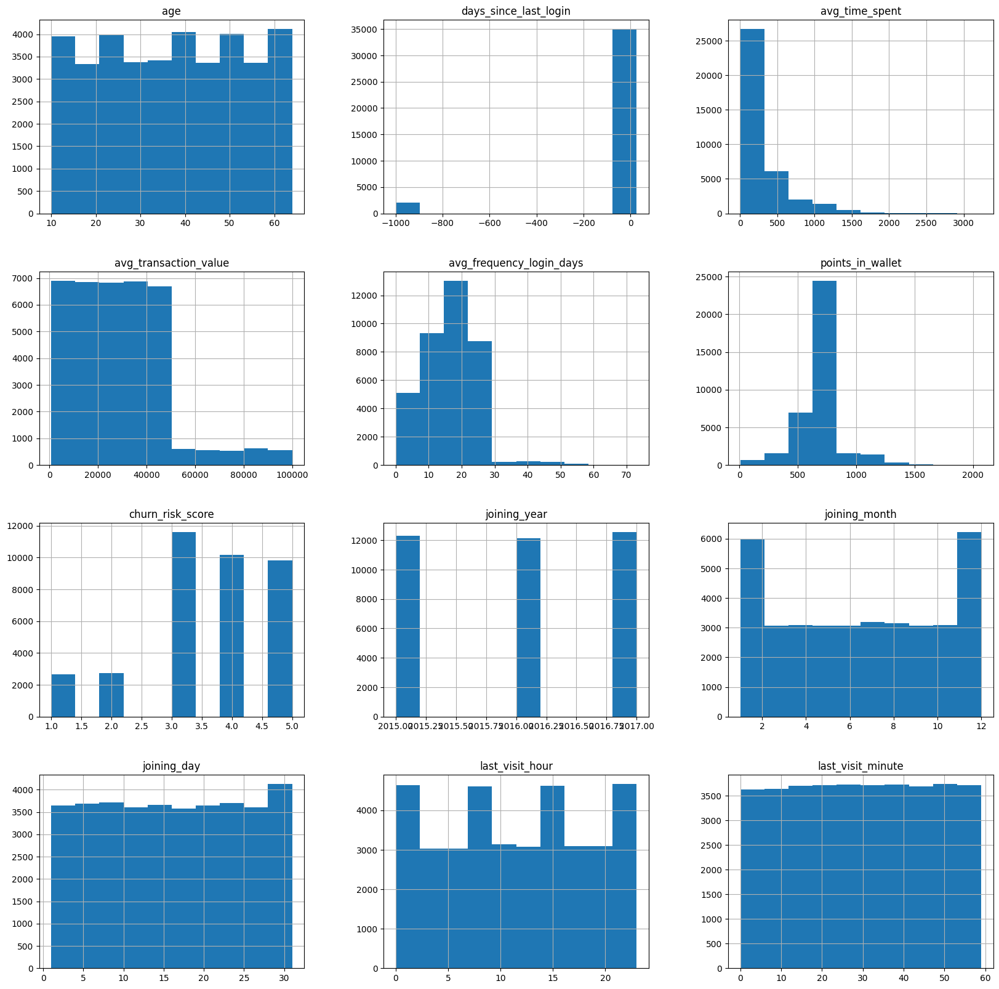

In [ ]:
preprocess_df.hist(figsize=(20, 20))
plt.show()

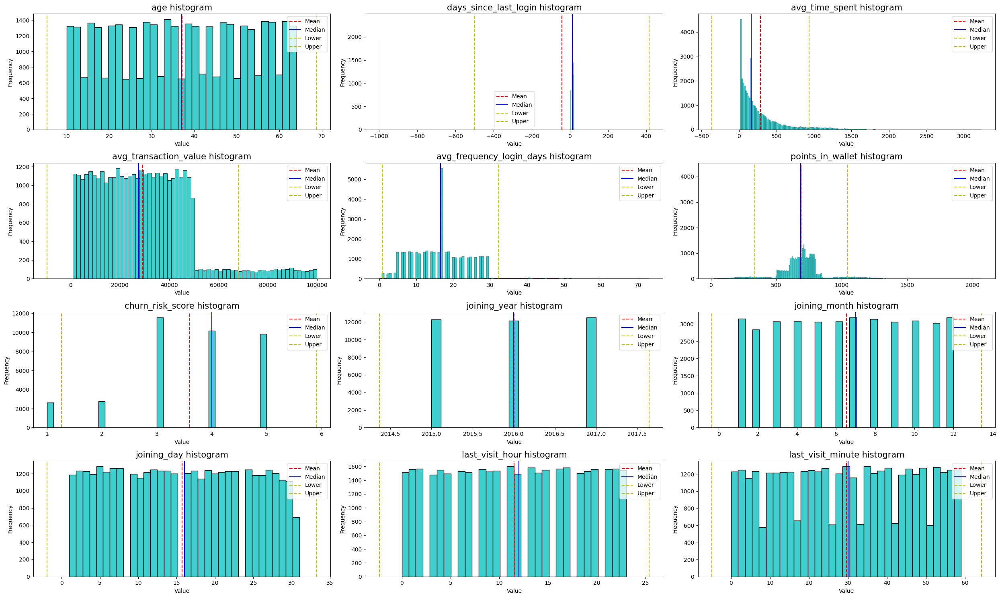

In [ ]:
# plot the numerical features
# numerical feature
def plot_numerical_feature(df, continous_columns):
    l = len(continous_columns)
    n = 3
    row = lambda l, n: int(l/n) if l%n==0 else int(int(l/n)+1)
    m = row(l, n)
    # set position for figure
    fig , ax = plt.subplots(m,n, figsize=(25,15))
    if ( m <= 1):
        for j in range(n):
            index = j
            if index >= len(continous_columns):
                break
            mean = df[continous_columns[index]].describe()['mean']
            median = df[continous_columns[index]].describe()['50%']
            lower = mean - 2*df[continous_columns[index]].describe()['std']
            upper = mean + 2*df[continous_columns[index]].describe()['std']
            sns.histplot(x = continous_columns[j], data = df, ax=ax[j], color='c')
            ax[j].axvline(mean, label='Mean', color='r', linestyle='dashed')
            ax[j].axvline(median, label='Median', color='b')
            ax[j].axvline(lower, label='Lower', color='y', linestyle='dashed')
            ax[j].axvline(upper, label='Upper', color='y', linestyle='dashed')
            ax[j].set_title(f"{continous_columns[index]} histogram", fontsize=15)
            ax[j].set_xlabel('Value')
            ax[j].set_ylabel('Frequency')
            ax[j].legend()
    else:
        for i in range(m):
            for j in range(n):
                index = n*i + j
                if index >= len(continous_columns):
                    break
                mean = df[continous_columns[index]].describe()['mean']
                median = df[continous_columns[index]].describe()['50%']
                lower = mean - 2*df[continous_columns[index]].describe()['std']
                upper = mean + 2*df[continous_columns[index]].describe()['std']
                sns.histplot(x = continous_columns[index], data = df, ax=ax[i, j], color='c')
                ax[i, j].axvline(mean, label='Mean', color='r', linestyle='dashed')
                ax[i, j].axvline(median, label='Median', color='b')
                ax[i, j].axvline(lower, label='Lower', color='y', linestyle='dashed')
                ax[i, j].axvline(upper, label='Upper', color='y', linestyle='dashed')
                ax[i, j].set_title(f"{continous_columns[index]} histogram", fontsize=15)
                ax[i, j].set_xlabel('Value')
                ax[i, j].set_ylabel('Frequency')
                ax[i, j].legend()
    plt.tight_layout()
    plt.show()

plot_numerical_feature(preprocess_df, numerical_cols)

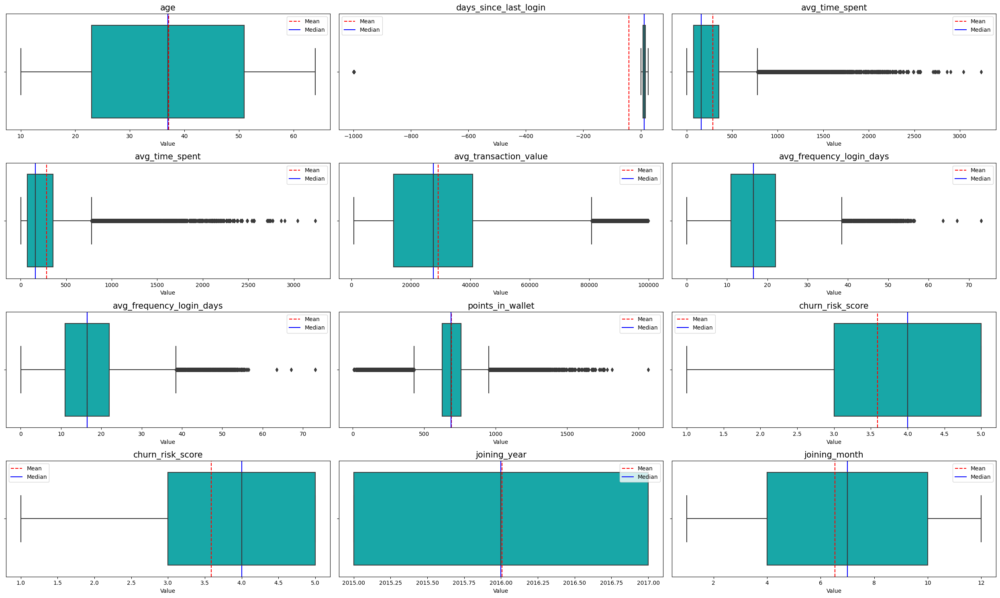

In [ ]:
# Boxplot
def boxplot_numerical_features(df, continous_columns):
    l = len(continous_columns)
    n = 3
    row = lambda l, n: int(l/n) if l%n==0 else int(int(l/n)+1)
    m = row(l, n)
    # set position for figure
    fig , ax = plt.subplots(m,n, figsize=(25,15))
    if ( m <= 1):
        for j in range(n):
            index = j
            if index > len(continous_columns):
                break
            mean = df[continous_columns[index]].describe()['mean']
            median = df[continous_columns[index]].describe()['50%']
            sns.boxplot(x=continous_columns[index], data =df, ax=ax[index], color='c')
            ax[index].axvline(mean, label='Mean', color='r', linestyle='dashed')
            ax[index].axvline(median, label='Median', color='b')
            ax[index].set_title(f"{continous_columns[index]}", fontsize=15)
            ax[index].set_xlabel('Value')
            ax[index].legend()
    else:
        for i in range(m):
            for j in range(n):
                index = 2*i + j
                if index > len(continous_columns):
                    break
                mean = df[continous_columns[index]].describe()['mean']
                median = df[continous_columns[index]].describe()['50%']
                sns.boxplot(x=continous_columns[index], data =df, ax=ax[i, j], color='c')
                ax[i, j].axvline(mean, label='Mean', color='r', linestyle='dashed')
                ax[i, j].axvline(median, label='Median', color='b')
                ax[i, j].set_title(f"{continous_columns[index]}", fontsize=15)
                ax[i, j].set_xlabel('Value')
                ax[i, j].legend()
    plt.tight_layout()
    plt.show()
boxplot_numerical_features(preprocess_df, numerical_cols)

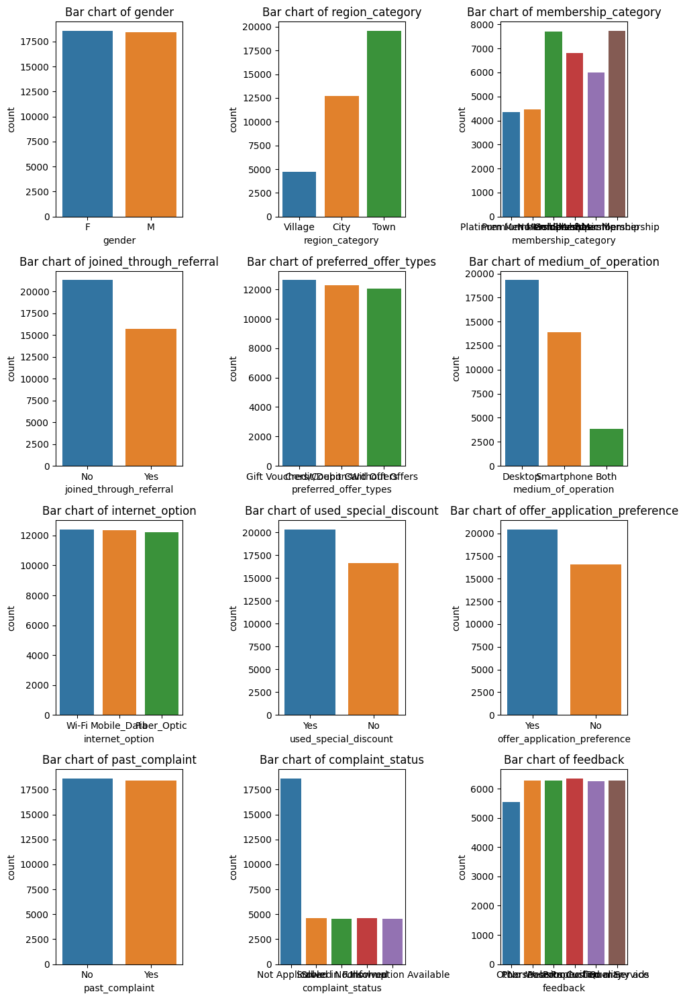

In [ ]:
categorical_cols = np.array(categorical_cols).reshape(4, 3)
fig, ax = plt.subplots(categorical_cols.shape[0], categorical_cols.shape[1], figsize = (10,15))

for i in range(categorical_cols.shape[0]):
    for j in range(categorical_cols.shape[1]):
        if categorical_cols[i, j] == '':
            continue
        sns.countplot(data = preprocess_df, x = categorical_cols[i,j], ax = ax[i, j])
        ax[i, j].set_title('Bar chart of ' + categorical_cols[i,j])

plt.tight_layout()
plt.show()

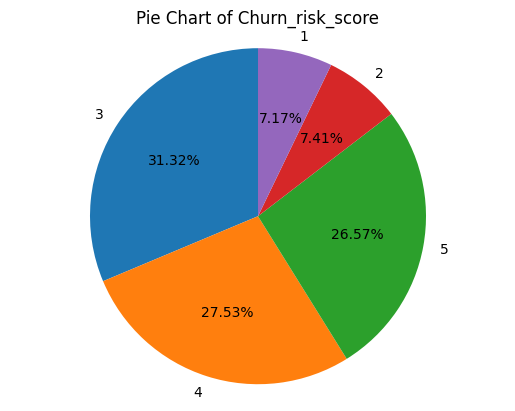

In [ ]:
label_target = preprocess_df['churn_risk_score'].value_counts().index.to_list()

plt.pie(preprocess_df['churn_risk_score'].value_counts(), labels=label_target, autopct='%.2f%%', startangle=90)
plt.axis('equal')
plt.title('Pie Chart of Churn_risk_score')
plt.show()

<ipython-input-42-914fd9750f79>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(preprocess_df.corr(), annot = True, linewidth=.5, fmt=".1f")


<Axes: >

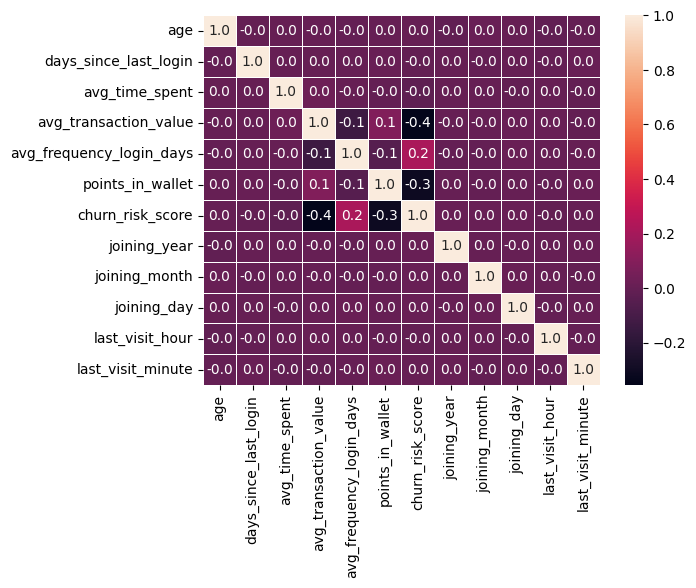

In [ ]:
sns.heatmap(preprocess_df.corr(), annot = True, linewidth=.5, fmt=".1f")

# Feature Engineer

In [92]:
fe = preprocess_df.copy()

## Handle Outlier

In [52]:
def imputate_outlier(data, feature, lower_bound, upper_bound, mode = None):
    # mode take mean, median, or IQR
    Q1 = data[feature].quantile(0.25) # or Q1 = np.percentile(df['column'], lower_bound)
    Q3 = data[feature].quantile(0.75)
    IQR = Q3 - Q1
    lower_extreme = Q1 - 1.5*IQR
    upper_extreme = Q3 + 1.5*IQR

    outliers = data[(data[feature] < lower_extreme) | (data[feature] > upper_extreme)]
    percent_outliers = len(outliers) / len(data) * 100
    print('Percent of outlier in',feature,':',percent_outliers)

    if mode == 'mean':
        data.loc[data[feature] < lower_extreme, feature] = data[feature].mean()
        data.loc[data[feature] > upper_extreme, feature] = data[feature].mean()
    elif mode == 'median':
        data.loc[data[feature] < lower_extreme, feature] = data[feature].median()
        data.loc[data[feature] > upper_extreme, feature] = data[feature].median()
    else: # IQR
        data.loc[data[feature] < lower_extreme, feature] = data[feature].quantile(lower_bound)
        data.loc[data[feature] > upper_extreme, feature] = data[feature].quantile(upper_bound)

    return data

In [53]:
# fe = imputate_outlier(fe, 'avg_frequency_login_days', 0.25, 0.75, 'mean')

# fe = imputate_outlier(fe, 'avg_time_spent', 0.25, 0.75, 'median')

# fe = imputate_outlier(fe, 'points_in_wallet', 0.25, 0.75, 'mean')

Percent of outlier in avg_frequency_login_days : 1.2705449826989619
Percent of outlier in avg_time_spent : 8.72350778546713
Percent of outlier in points_in_wallet : 12.667603806228373


## Encoding
* One-hot encoding work not good as label encoding for all feature even most of theme are nominal but it lead to high-dimension (even I tuning PCA in cross-validation) so I use label encoding for all feature

In [93]:
from sklearn.preprocessing import LabelEncoder
Encoder = LabelEncoder()
fe['membership_category'] = Encoder.fit_transform(fe['membership_category'])
# for i in categorical_cols.flatten().tolist():
#     fe[i] = Encoder.fit_transform(fe[i])

In [94]:
nominal_encode = categorical_cols
nominal_encode = np.delete(nominal_encode, 2) # 2 as index if membership_category
nominal_encode

array(['gender', 'region_category', 'joined_through_referral',
       'preferred_offer_types', 'medium_of_operation', 'internet_option',
       'used_special_discount', 'offer_application_preference',
       'past_complaint', 'complaint_status', 'feedback'], dtype='<U28')

In [95]:
fe = pd.get_dummies(fe, prefix=nominal_encode, columns=nominal_encode)
fe

,age,membership_category,days_since_last_login,avg_time_spent,avg_transaction_value,avg_frequency_login_days,points_in_wallet,churn_risk_score,joining_year,joining_month,...,complaint_status_Not Applicable,complaint_status_Solved,complaint_status_Solved in Follow-up,complaint_status_Unsolved,feedback_No reason specified,feedback_Others,feedback_Poor Customer Service,feedback_Poor Product Quality,feedback_Poor Website,feedback_Too many ads
0,18,3,17,300.630,53005.25,17.000000,781.750000,2,2017,8,...,1,0,0,0,0,1,0,0,0,0
1,32,4,16,306.340,12838.38,10.000000,686.882199,1,2017,8,...,0,1,0,0,0,1,0,0,0,0
2,44,2,14,516.160,21027.00,22.000000,500.690000,5,2016,11,...,0,0,1,0,0,0,0,0,1,0
3,37,2,11,53.270,25239.56,6.000000,567.660000,5,2016,10,...,0,0,0,1,0,0,0,0,1,0
4,31,2,20,113.130,24483.66,16.000000,663.060000,5,2017,9,...,0,1,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36987,46,0,2,161.765,27277.68,6.000000,639.510000,4,2017,9,...,0,0,0,0,1,0,0,0,0,0
36988,29,0,13,161.765,11069.71,28.000000,527.990000,5,2016,6,...,1,0,0,0,0,0,1,0,0,0
36989,23,0,12,154.940,38127.56,16.538615,680.470000,4,2016,9,...,0,0,0,1,0,0,0,0,1,0
36990,53,3,15,482.610,2378.86,20.000000,197.264414,3,2017,6,...,1,0,0,0,1,0,0,0,0,0


## Feature transformation


In [57]:
# from sklearn.preprocessing import PowerTransformer
# scaler = PowerTransformer(method = 'box-cox')
# '''
# parameters:
# method = 'box-cox' or 'yeo-johnson'
# '''

"\nparameters:\nmethod = 'box-cox' or 'yeo-johnson'\n"

In [58]:
# fe['avg_time_spent'] = scaler.fit_transform(fe['avg_time_spent'].values.reshape(-1, 1))
# fe['avg_transaction_value'] = scaler.fit_transform(fe['avg_transaction_value'].values.reshape(-1, 1))
# fe['avg_frequency_login_days'] = scaler.fit_transform(fe['avg_frequency_login_days'].values.reshape(-1, 1))

array([[<Axes: title={'center': 'avg_time_spent'}>,
        <Axes: title={'center': 'avg_transaction_value'}>],
       [<Axes: title={'center': 'avg_frequency_login_days'}>, <Axes: >]],
      dtype=object)

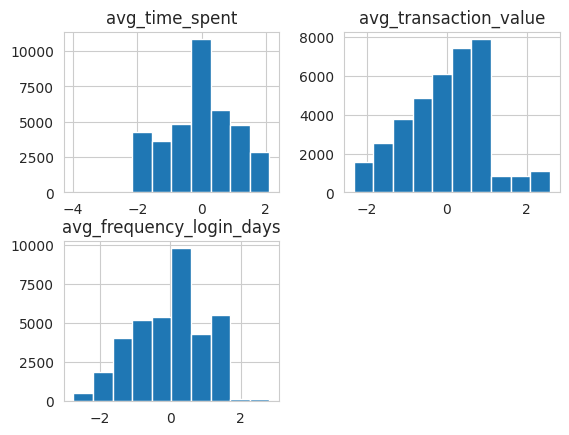

In [59]:
# skewed_features = ['avg_time_spent','avg_transaction_value','avg_frequency_login_days']
# fe[skewed_features].hist()

## Feature selection

In [ ]:
X = fe.drop('churn_risk_score', axis = 1)
Y = fe['churn_risk_score']

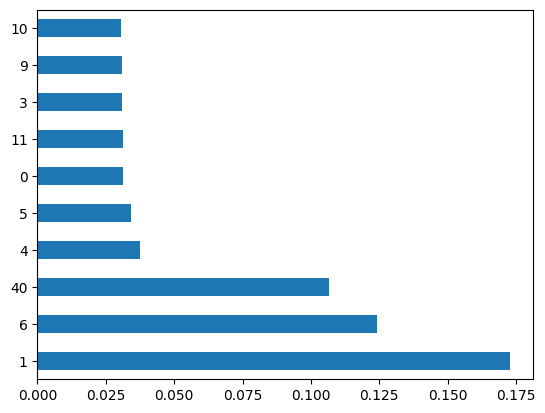

In [ ]:
from sklearn.ensemble import ExtraTreesClassifier

model = ExtraTreesClassifier(n_estimators=100)
model.fit(X, Y)
# print(model.feature_importances_)
f_importance = pd.DataFrame({'Feature_Name': X.columns, 'Weight_Importance': model.feature_importances_})
feat = pd.Series(model.feature_importances_)
feat = feat.reindex(range(len(feat)))
feat.nlargest(10).plot(kind = 'barh')
plt.show()

In [ ]:
f_importance_sorted = f_importance.sort_values(by='Weight_Importance', ascending=False)
f_importance_sorted = f_importance_sorted.reset_index(drop=True)
f_importance_sorted

,Feature_Name,Weight_Importance
0,membership_category,0.172782
1,points_in_wallet,0.124058
2,feedback_Others,0.106641
3,avg_transaction_value,0.037455
4,avg_frequency_login_days,0.034168
5,age,0.031219
6,last_visit_minute,0.031150
7,avg_time_spent,0.031043
8,joining_day,0.030817
9,last_visit_hour,0.030550


## Apply PCA

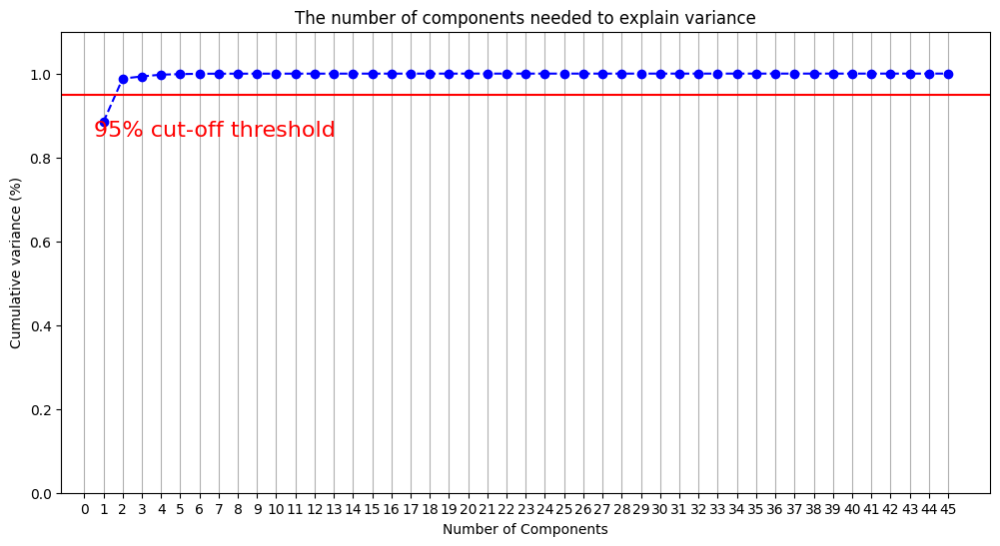

In [ ]:
from sklearn.decomposition import PCA
X = fe.drop('churn_risk_score', axis = 1)
Y = fe['churn_risk_score']
pca = PCA().fit(X)

plt.rcParams["figure.figsize"] = (12,6)

fig, ax = plt.subplots()
xi = np.arange(1, X.shape[1]+1, step=1)
y = np.cumsum(pca.explained_variance_ratio_)

plt.ylim(0.0,1.1)
plt.plot(xi, y, marker='o', linestyle='--', color='b')

plt.xlabel('Number of Components')
plt.xticks(np.arange(0, X.shape[1]+1, step=1)) #change from 0-based array index to 1-based human-readable label
plt.ylabel('Cumulative variance (%)')
plt.title('The number of components needed to explain variance')

plt.axhline(y=0.95, color='r', linestyle='-')
plt.text(0.5, 0.85, '95% cut-off threshold', color = 'red', fontsize=16)

ax.grid(axis='x')
plt.show()

## Split data

In [96]:
# Split the data into training and test sets
X = fe.drop('churn_risk_score', axis = 1)
Y = fe['churn_risk_score']
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=42)

In [63]:
# pca = PCA(n_components=4)
# X_train = pca.fit_transform(X_train)
# X_test = pca.transform(X_test)

# Model without feature engineer

In [16]:
from sklearn.model_selection import train_test_split, KFold
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, MinMaxScaler, PolynomialFeatures
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc ,\
                        confusion_matrix, classification_report, ConfusionMatrixDisplay, multilabel_confusion_matrix
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn import linear_model
from sklearn.naive_bayes import GaussianNB, BernoulliNB, CategoricalNB, ComplementNB, MultinomialNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.cluster import AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

In [17]:
# evaluation model
def evaluate_model(y_true, y_pred):
    """
    :param y_true: ground truth values
    :param y_pred: predictions
    # """
    print("accuracy", accuracy_score(y_true, y_pred))
    print("precision", precision_score(y_true, y_pred, average = 'weighted'))
    print("recall", recall_score(y_true, y_pred, average = 'weighted'))
    print("F1", f1_score(y_true, y_pred, average = 'weighted'))

    # print("ROC_AUC ", roc_auc_score(y_true, y_pred, average = 'weighted', multi_class='ovr'))
    report = classification_report(y_true, y_pred)
    print("Classification Report\n",report)

	# # tn, fp, fn, tp = confusion_matrix(test_labels, y_pred).ravel()
    display_label = np.unique(y_true)
    cm= confusion_matrix(y_pred, y_true)
    cm_display = ConfusionMatrixDisplay(confusion_matrix = cm)
    cm_display.plot()
    plt.show()
    # print(cm_display)

In [ ]:
# numerical_cols.remove('churn_risk_score')
# def kfold_save_model(model_chosen, X, y, n_splits=5):
#     kf = KFold(n_splits=n_splits, shuffle=True, random_state = 42)
#     best_score = 0
#     best_dataset = None
#     for i, (train_index, test_index) in enumerate(kf.split(X)):
#         print(f'Fold {i+1}th in total {n_splits} Fold')
#         X_train, X_test = X.iloc[train_index,:], X.iloc[test_index,:]
#         y_train, y_test = y.iloc[train_index], y.iloc[test_index]

#         # Standardize numerical data train and test
#         scaler = StandardScaler()
#         X_train[numerical_cols] = scaler.fit_transform(X_train[numerical_cols])
#         X_test[numerical_cols] = scaler.transform(X_test[numerical_cols])

#         # Build model with Data train
#         model = model_chosen(X_train, y_train)

#         # Evaluate
#         y_pred = model.predict(X_test)
#         score = recall_score(y_test, y_pred, average = 'weighted')
#         # score = model.score(X_test, y_test)

#         # save best model and data train with best score
#         if score > best_score:
#             best_score = score
#             best_dataset = (X_train, X_test, y_train, y_test)
#             best_model = model

#     # Train your best model using the best dataset (X_train, y_train) and return the trained model
#     print('Taking best model with best data train')
#     X_train_best, _, y_train_best, _ = best_dataset
#     best_model.fit(X_train_best, y_train_best)
#     print("Best parameter (CV score=%0.3f):" % model.best_score_)
#     print(model.best_params_)

#     return best_model, best_dataset

## LogisticRegression

In [24]:
def build_model_LogisticRegression(X, y):
    scale = StandardScaler()
    scale.fit_transform(X)

    # Create the pipeline
    pipeline = Pipeline([
        ('scaler', StandardScaler()),
        ('classifier', LogisticRegression(multi_class='multinomial'))
    ])

    # Define the hyperparameters to tune and their potential values
    param_grid = {
        'classifier__C': [0.1, 1, 10],
        'classifier__solver': ['newton-cg', 'saga', 'sag', 'lbfgs']
    }
    model = GridSearchCV(pipeline, param_grid, scoring='recall_weighted', cv=5)
    model.fit(X, y)
    print(model.best_estimator_)
    return model

In [25]:
%%time
Logistic_model = build_model_LogisticRegression(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

Pipeline(steps=[('scaler', StandardScaler()),
                ('classifier',
                 LogisticRegression(C=10, multi_class='multinomial'))])
CPU times: user 4min 2s, sys: 50.2 s, total: 4min 52s
Wall time: 3min 46s


accuracy 0.5035141466930979
precision 0.4931736654053344
recall 0.5035141466930979
F1 0.4967787669753996
Classification Report
               precision    recall  f1-score   support

           1       0.57      0.57      0.57       767
           2       0.58      0.62      0.60       836
           3       0.67      0.68      0.68      3455
           4       0.29      0.23      0.26      3054
           5       0.45      0.52      0.48      2986

    accuracy                           0.50     11098
   macro avg       0.51      0.53      0.52     11098
weighted avg       0.49      0.50      0.50     11098



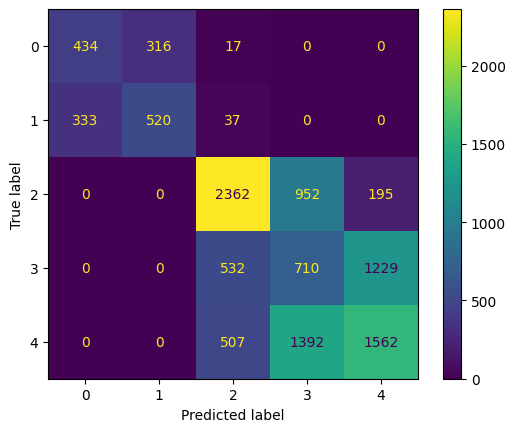

In [26]:
y_pred = Logistic_model.predict(X_test)
evaluate_model(np.array(y_test), np.array(y_pred))

## Polynomial Model


In [ ]:
def build_Polynomial_model(X, y):
  pipeline = Pipeline([
    ('poly', PolynomialFeatures()),
    ('scaler', StandardScaler()),
    ('classifier', LogisticRegression(multi_class='multinomial'))
])

  # Define the parameter grid for GridSearchCV
  param_grid = {
      'poly__degree': [1, 2, 3, 4, 5],  # Values to try for the degree of polynomial features
      'classifier__C': [0.1, 1, 10, 1E3],
      'classifier__solver': ['newton-cg', 'saga', 'sag', 'lbfgs']
  }
  model = GridSearchCV(pipeline, param_grid=param_grid, cv=5, scoring = 'recall_weighted')
  model.fit(X, y)
  print(model.best_estimator_)
  return model

In [ ]:
%%time
Polynomial_model = build_Polynomial_model(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/utils/optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the 

Pipeline(steps=[('scaler', StandardScaler()), ('pca', PCA(n_components=4)),
                ('poly', PolynomialFeatures(degree=3)),
                ('classifier',
                 LogisticRegression(C=1, multi_class='multinomial',
                                    solver='newton-cg'))])
CPU times: user 32min 10s, sys: 2.03 s, total: 32min 12s
Wall time: 32min 19s


accuracy 0.41052441881420076
precision 0.38890647778625786
recall 0.41052441881420076
F1 0.37086754199521477
Classification Report
               precision    recall  f1-score   support

           1       0.43      0.35      0.39       767
           2       0.49      0.50      0.49       836
           3       0.41      0.66      0.51      3455
           4       0.31      0.08      0.12      3054
           5       0.41      0.46      0.43      2986

    accuracy                           0.41     11098
   macro avg       0.41      0.41      0.39     11098
weighted avg       0.39      0.41      0.37     11098



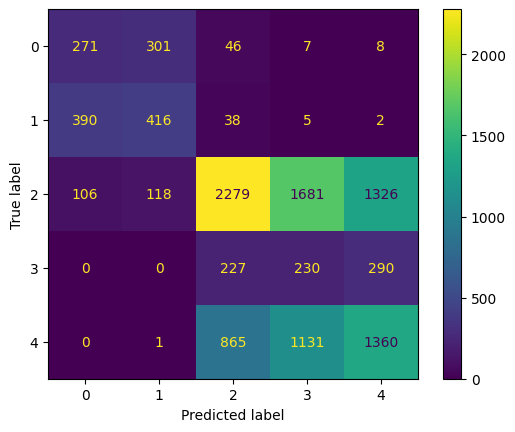

In [ ]:
y_pred = Polynomial_model.predict(X_test)
evaluate_model(np.array(y_test), np.array(y_pred))

## Complement NB


In [27]:
from sklearn.preprocessing import MinMaxScaler

def build_model_ComplementNB(X, y):

    pipe = Pipeline(steps=[("scale", MinMaxScaler()), ("NB", ComplementNB())], verbose=True)
    param_grid = {
        'NB__alpha': np.arange(0, 2.01, 0.05),
        'NB__fit_prior': [False, True],
        'NB__class_prior': [None],
        'NB__norm': [False]
    }
    model = GridSearchCV(pipe, param_grid, scoring='recall_weighted', n_jobs=4)
    model.fit(X, y)
    print(model.best_estimator_)
    return model

ComplementNB_model = build_model_ComplementNB(X_train, y_train)
ComplementNB_model

[Pipeline] ............. (step 1 of 2) Processing scale, total=   0.0s
[Pipeline] ................ (step 2 of 2) Processing NB, total=   0.0s
Pipeline(steps=[('scale', MinMaxScaler()),
                ('NB', ComplementNB(alpha=0.0, fit_prior=False))],
         verbose=True)


/usr/local/lib/python3.10/dist-packages/sklearn/naive_bayes.py:629: FutureWarning: The default value for `force_alpha` will change to `True` in 1.4. To suppress this warning, manually set the value of `force_alpha`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/naive_bayes.py:635: UserWarning: alpha too small will result in numeric errors, setting alpha = 1.0e-10. Use `force_alpha=True` to keep alpha unchanged.
  warnings.warn(


GridSearchCV(estimator=Pipeline(steps=[('scale', MinMaxScaler()),
                                       ('NB', ComplementNB())],
                                verbose=True),
             n_jobs=4,
             param_grid={'NB__alpha': array([0.  , 0.05, 0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35, 0.4 , 0.45, 0.5 ,
       0.55, 0.6 , 0.65, 0.7 , 0.75, 0.8 , 0.85, 0.9 , 0.95, 1.  , 1.05,
       1.1 , 1.15, 1.2 , 1.25, 1.3 , 1.35, 1.4 , 1.45, 1.5 , 1.55, 1.6 ,
       1.65, 1.7 , 1.75, 1.8 , 1.85, 1.9 , 1.95, 2.  ]),
                         'NB__class_prior': [None],
                         'NB__fit_prior': [False, True], 'NB__norm': [False]},
             scoring='recall_weighted')

accuracy 0.49927914939628765
precision 0.46478209829326506
recall 0.49927914939628765
F1 0.44286408678909006
Classification Report
               precision    recall  f1-score   support

           1       0.53      0.19      0.27       767
           2       0.52      0.86      0.64       836
           3       0.58      0.70      0.64      3455
           4       0.32      0.07      0.12      3054
           5       0.44      0.69      0.54      2986

    accuracy                           0.50     11098
   macro avg       0.48      0.50      0.44     11098
weighted avg       0.46      0.50      0.44     11098



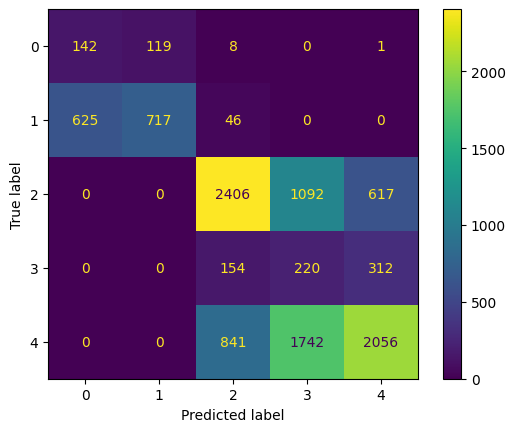

In [28]:
y_pred = ComplementNB_model.predict(X_test)
evaluate_model(np.array(y_test), np.array(y_pred))

## GaussianNB


In [29]:
def build_model_GaussianNB(X, y):
    pipe = Pipeline(steps=[("NB", GaussianNB())], verbose=True)
    param_grid = {
        'NB__var_smoothing': np.logspace(-1, -9, num=200)
    }
    model = GridSearchCV(pipe, param_grid, scoring='recall_weighted', n_jobs=3)
    model.fit(X, y)
    return model

model_GaussianNB = build_model_GaussianNB(X_train, y_train)
model_GaussianNB

[Pipeline] ................ (step 1 of 1) Processing NB, total=   0.0s


GridSearchCV(estimator=Pipeline(steps=[('NB', GaussianNB())], verbose=True),
             n_jobs=3,
             param_grid={'NB__var_smoothing': array([1.00000000e-01, 9.11588830e-02, 8.30994195e-02, 7.57525026e-02,
       6.90551352e-02, 6.29498899e-02, 5.73844165e-02, 5.23109931e-02,
       4.76861170e-02, 4.34701316e-02, 3.96268864e-02, 3.61234270e-02,
       3.29297126e-02, 3.00183581e-02, 2.73644000e-02, 2.4...
       8.40665289e-09, 7.66341087e-09, 6.98587975e-09, 6.36824994e-09,
       5.80522552e-09, 5.29197874e-09, 4.82410870e-09, 4.39760361e-09,
       4.00880633e-09, 3.65438307e-09, 3.33129479e-09, 3.03677112e-09,
       2.76828663e-09, 2.52353917e-09, 2.30043012e-09, 2.09704640e-09,
       1.91164408e-09, 1.74263339e-09, 1.58856513e-09, 1.44811823e-09,
       1.32008840e-09, 1.20337784e-09, 1.09698580e-09, 1.00000000e-09])},
             scoring='recall_weighted')

accuracy 0.5228870066678681
precision 0.4835863602263009
recall 0.5228870066678681
F1 0.46731425326411136
Classification Report
               precision    recall  f1-score   support

           1       0.56      0.61      0.58       767
           2       0.61      0.45      0.52       836
           3       0.60      0.65      0.63      3455
           4       0.30      0.06      0.11      3054
           5       0.48      0.84      0.61      2986

    accuracy                           0.52     11098
   macro avg       0.51      0.52      0.49     11098
weighted avg       0.48      0.52      0.47     11098



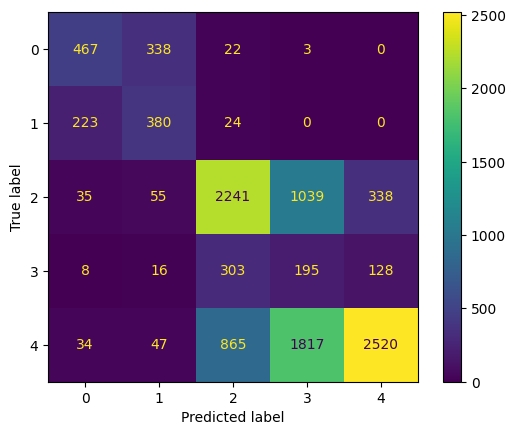

In [30]:
y_pred = model_GaussianNB.predict(X_test)
evaluate_model(np.array(y_test), np.array(y_pred))

## CategoricalNB

In [31]:
def build_model_CategoricalNB(X, y):
    pipe = Pipeline(steps=[("scale", MinMaxScaler()), ("NB", CategoricalNB())], verbose=True)

    param_grid = {
        'NB__alpha': np.arange(0.1, 5.01, 0.05),
        'NB__force_alpha': [False, True]
    }
    model = GridSearchCV(pipe, param_grid, scoring="recall_weighted", n_jobs=2)
    model.fit(X, y)

    return model

CategoricalNB_model = build_model_CategoricalNB(X_train, y_train)
CategoricalNB_model

[Pipeline] ............. (step 1 of 2) Processing scale, total=   0.0s
[Pipeline] ................ (step 2 of 2) Processing NB, total=   0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
  warnings.warn(


GridSearchCV(estimator=Pipeline(steps=[('scale', MinMaxScaler()),
                                       ('NB', CategoricalNB())],
                                verbose=True),
             n_jobs=2,
             param_grid={'NB__alpha': array([0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35, 0.4 , 0.45, 0.5 , 0.55, 0.6 ,
       0.65, 0.7 , 0.75, 0.8 , 0.85, 0.9 , 0.95, 1.  , 1.05, 1.1 , 1.15,
       1.2 , 1.25, 1.3 , 1.35, 1.4 , 1.45, 1.5 , 1.55, 1.6 , 1.65, 1.7 ,
       1.75, 1.8 , 1.85, 1.9 , 1.95, 2.  , 2.05, 2.1 , 2.15, 2.2 , 2.25,
       2.3 , 2.35, 2.4 , 2.45, 2.5 , 2.55, 2.6 , 2.65, 2.7 , 2.75, 2.8 ,
       2.85, 2.9 , 2.95, 3.  , 3.05, 3.1 , 3.15, 3.2 , 3.25, 3.3 , 3.35,
       3.4 , 3.45, 3.5 , 3.55, 3.6 , 3.65, 3.7 , 3.75, 3.8 , 3.85, 3.9 ,
       3.95, 4.  , 4.05, 4.1 , 4.15, 4.2 , 4.25, 4.3 , 4.35, 4.4 , 4.45,
       4.5 , 4.55, 4.6 , 4.65, 4.7 , 4.75, 4.8 , 4.85, 4.9 , 4.95, 5.  ]),
                         'NB__force_alpha': [False, True]},
             scoring='recall_weighted')

accuracy 0.42133717786988645
precision 0.4562296633137986
recall 0.42133717786988645
F1 0.37691352689601454
Classification Report
               precision    recall  f1-score   support

           1       0.54      0.93      0.68       767
           2       0.80      0.32      0.46       836
           3       0.39      0.33      0.36      3455
           4       0.49      0.11      0.17      3054
           5       0.38      0.74      0.50      2986

    accuracy                           0.42     11098
   macro avg       0.52      0.49      0.43     11098
weighted avg       0.46      0.42      0.38     11098



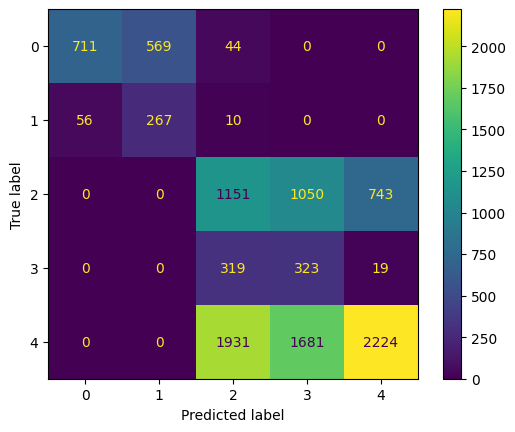

In [32]:
y_pred = CategoricalNB_model.predict(X_test)
evaluate_model(np.array(y_test), np.array(y_pred))

## MultinomialNB


In [33]:
def build_model_MultinomialNB(X, y):
    pipe = Pipeline(steps=[("scale", MinMaxScaler()), ("NB", MultinomialNB())], verbose=True)
    param_grid = {
        'NB__alpha': np.arange(0.1, 5.01, 0.05),
        'NB__fit_prior': [False, True]
    }

    model = GridSearchCV(pipe, param_grid, scoring="recall_weighted", n_jobs=2)
    model.fit(X, y)

    return model

In [34]:
%%time
MultinomialNB_model = build_model_MultinomialNB(X_train, y_train)

[Pipeline] ............. (step 1 of 2) Processing scale, total=   0.0s
[Pipeline] ................ (step 2 of 2) Processing NB, total=   0.0s
CPU times: user 3.55 s, sys: 539 ms, total: 4.09 s
Wall time: 44.2 s


accuracy 0.4840511803928636
precision 0.46207495720932057
recall 0.4840511803928636
F1 0.4450053308826651
Classification Report
               precision    recall  f1-score   support

           1       0.50      0.54      0.52       767
           2       0.55      0.54      0.55       836
           3       0.49      0.78      0.60      3455
           4       0.37      0.12      0.18      3054
           5       0.49      0.49      0.49      2986

    accuracy                           0.48     11098
   macro avg       0.48      0.49      0.47     11098
weighted avg       0.46      0.48      0.45     11098



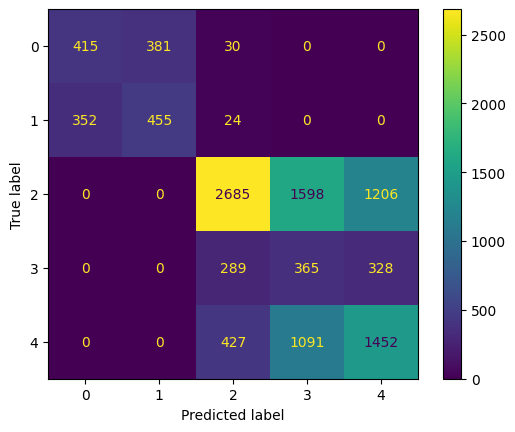

In [35]:
y_pred = MultinomialNB_model.predict(X_test)
evaluate_model(np.array(y_test), np.array(y_pred))

## Random Forest

In [41]:
def build_model_RandomForest(X, y):

    pipe = Pipeline(steps=[ ("tree", RandomForestClassifier(random_state = 42, n_jobs = -1))], verbose = True)
    param_grid = {
        'tree__n_estimators': [1, 5, 20, 50, 300, None],
        'tree__criterion': ['gini', 'entropy', 'log_loss'],
        'tree__max_features': [None, 'auto', 'sqrt', 'log2']
    }
    model = GridSearchCV(pipe, param_grid, scoring = 'recall_weighted', n_jobs = -1)
    model.fit(X, y)

    return model

In [42]:
%%time
RandomForest_model = build_model_RandomForest(X_train,y_train)

/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
60 fits failed out of a total of 360.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
60 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py

[Pipeline] .............. (step 1 of 1) Processing tree, total= 1.2min
CPU times: user 2min 18s, sys: 1.6 s, total: 2min 19s
Wall time: 31min 48s


accuracy 0.7649125968642999
precision 0.771770733566392
recall 0.7649125968642999
F1 0.7627320632279871
Classification Report
               precision    recall  f1-score   support

           1       0.68      0.88      0.77       767
           2       0.84      0.66      0.74       836
           3       0.91      0.85      0.88      3455
           4       0.69      0.58      0.63      3054
           5       0.70      0.86      0.77      2986

    accuracy                           0.76     11098
   macro avg       0.76      0.77      0.76     11098
weighted avg       0.77      0.76      0.76     11098



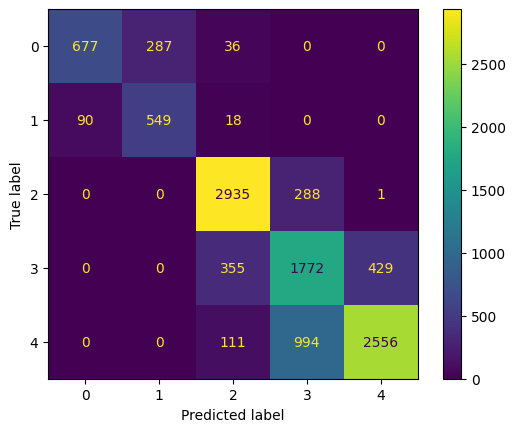

In [43]:
y_pred = RandomForest_model.predict(X_test)
evaluate_model(np.array(y_test), np.array(y_pred))

## SVM Classification

In [13]:
def build_model_SVM(X, y):
    pipe = Pipeline(steps=[ ("SVM", SVC(random_state = 42, max_iter = 1000))], verbose = True)

    param_grid = {
        'SVM__C': [1, 1e3, 1e6],
        'SVM__kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
        'SVM__degree': [1, 2, 3, 4, 5]
        }
    model = GridSearchCV(pipe, param_grid, scoring = 'recall', n_jobs = 3)
    model.fit(X, y)

    return model

In [ ]:
# %%time
# model, dataset = kfold_save_model(build_model_SVM, X, Y, 5)

# X_train, X_test, Y_train, Y_test = dataset
# X_train.shape, X_test.shape, Y_train.shape, Y_test.shape

In [19]:
%%time
SVM_model = build_model_SVM(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan]
  warnings.warn(


[Pipeline] ............... (step 1 of 1) Processing SVM, total=   1.7s
CPU times: user 22.1 s, sys: 2.49 s, total: 24.6 s
Wall time: 1h 3min 26s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


accuracy 0.1189403496125428
precision 0.3247799465826227
recall 0.1189403496125428
F1 0.08867644996402005
Classification Report
               precision    recall  f1-score   support

           1       0.08      0.91      0.14       767
           2       0.09      0.02      0.03       836
           3       0.33      0.03      0.05      3455
           4       0.30      0.16      0.21      3054
           5       0.47      0.00      0.01      2986

    accuracy                           0.12     11098
   macro avg       0.25      0.22      0.09     11098
weighted avg       0.32      0.12      0.09     11098



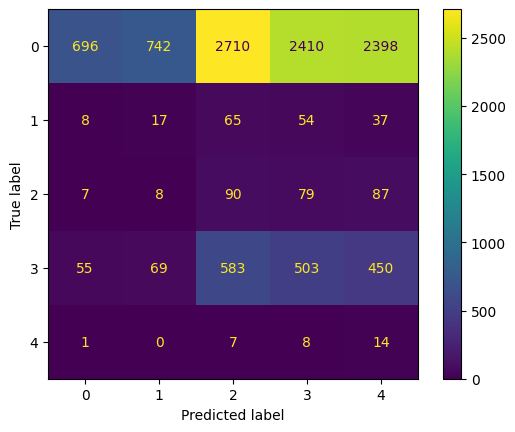

In [20]:
y_pred = SVM_model.predict(X_test)
evaluate_model(np.array(y_test), np.array(y_pred))

## Decision Tree Classification

In [21]:
def build_model_DecisionTree(X, y):

    pipe = Pipeline(steps=[ ("tree", DecisionTreeClassifier(random_state = 42))], verbose = True)
    param_grid = {
        'tree__criterion': ['gini', 'entropy', 'log_loss'],
        'tree__max_depth': [10, 20, 50, 100, 200, 300, None],
        'tree__min_samples_leaf': [1, 2, 3, 4, 5],
        'tree__max_features': ['auto', 'sqrt', 'log2', 'None']
        }
    model = GridSearchCV(pipe, param_grid, scoring = 'recall', n_jobs = 4)
    model.fit(X, y)

    return model

In [ ]:
# %%time
# model, dataset = kfold_save_model(build_model_DecisionTree, X, Y, 5)

# X_train, X_test, Y_train, Y_test = dataset
# X_train.shape, X_test.shape, Y_train.shape, Y_test.shape

In [22]:
%%time
DecisionTree_model = build_model_DecisionTree(X_train, y_train)

[Pipeline] .............. (step 1 of 1) Processing tree, total=   0.1s
CPU times: user 7.42 s, sys: 1.15 s, total: 8.57 s
Wall time: 2min 5s


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
525 fits failed out of a total of 2100.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
274 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 405, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py", line 889, in fit
    super().fit(
  File "/usr/local/lib/python3.10/dist-packages/sklearn

accuracy 0.6154262029194449
precision 0.6287227193486034
recall 0.6154262029194449
F1 0.6179466578726219
Classification Report
               precision    recall  f1-score   support

           1       0.51      0.44      0.47       767
           2       0.54      0.43      0.48       836
           3       0.80      0.72      0.76      3455
           4       0.49      0.63      0.55      3054
           5       0.63      0.57      0.60      2986

    accuracy                           0.62     11098
   macro avg       0.59      0.56      0.57     11098
weighted avg       0.63      0.62      0.62     11098



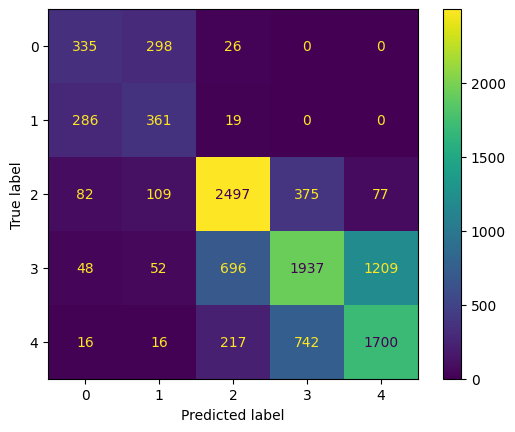

In [23]:
y_pred = DecisionTree_model.predict(X_test)
evaluate_model(np.array(y_test), np.array(y_pred))

## XGB Classification

In [ ]:
def build_model_XGB(X, y):

    pipe = Pipeline(steps=[ ("tree", XGBClassifier(objective="multi:softmax", random_state = 42, n_jobs = -1, booster = 'gbtree'))],\
                    verbose = True)
    param_grid = {
        "tree__n_estimators": [50, 100, 200],
        "tree__learning_rate": [1, 1e-3],
        "tree__max_depth": np.arange(3, 11, 1),
        }
    model = GridSearchCV(pipe, param_grid, scoring = 'recall', n_jobs = 3)
    model.fit(X, y)

    return model

In [ ]:
# %%time
# model, dataset = kfold_save_model(build_model_XGB, X, Y, 5)

# X_train, X_test, Y_train, Y_test = dataset
# X_train.shape, X_test.shape, Y_train.shape, Y_test.shape

In [ ]:
%%time
XGB_model = build_model_XGB(X_train, y_train-1)

[Pipeline] .............. (step 1 of 1) Processing tree, total=   8.6s
[Pipeline] .............. (step 1 of 1) Processing tree, total=   4.8s
[Pipeline] .............. (step 1 of 1) Processing tree, total=   3.6s
[Pipeline] .............. (step 1 of 1) Processing tree, total=   3.6s
[Pipeline] .............. (step 1 of 1) Processing tree, total=   4.8s
[Pipeline] .............. (step 1 of 1) Processing tree, total=   7.1s
[Pipeline] .............. (step 1 of 1) Processing tree, total=   8.3s
[Pipeline] .............. (step 1 of 1) Processing tree, total=   8.3s
[Pipeline] .............. (step 1 of 1) Processing tree, total=   8.3s
[Pipeline] .............. (step 1 of 1) Processing tree, total=   7.1s
[Pipeline] .............. (step 1 of 1) Processing tree, total=  16.5s
[Pipeline] .............. (step 1 of 1) Processing tree, total=  16.1s
[Pipeline] .............. (step 1 of 1) Processing tree, total=  17.0s
[Pipeline] .............. (step 1 of 1) Processing tree, total=  15.4s
[Pipel

accuracy 0.7659938727698684
precision 0.7855465246801464
recall 0.7659938727698684
F1 0.7553140259305091
Classification Report
               precision    recall  f1-score   support

           0       0.66      0.94      0.78       767
           1       0.90      0.61      0.73       836
           2       0.90      0.87      0.88      3455
           3       0.78      0.47      0.59      3054
           4       0.67      0.95      0.78      2986

    accuracy                           0.77     11098
   macro avg       0.78      0.77      0.75     11098
weighted avg       0.79      0.77      0.76     11098



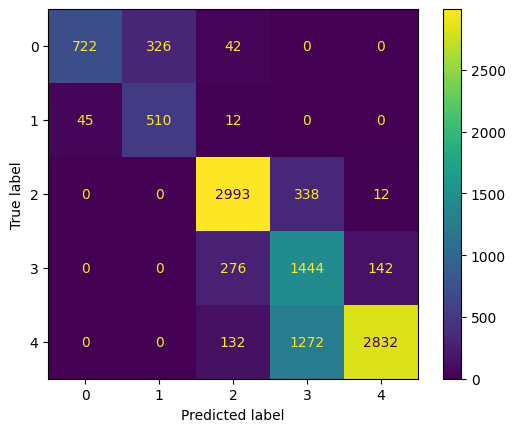

In [ ]:
y_pred = XGB_model.predict(X_test)
evaluate_model(np.array(y_test-1), np.array(y_pred))

## KNN

In [36]:
def build_model_KNN(X, y):
  # Định nghĩa các giá trị siêu tham số cho model KNN
  param_grid = {'n_neighbors': list(range(2, 10)),
                'weights': ['uniform', 'distance'],
                'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute']
                }
  # Sử dụng GridSearchCV để tìm kiếm siêu tham số tốt nhất cho model
  model = GridSearchCV(KNeighborsClassifier(), param_grid, scoring='recall')
  model.fit(X, y)
  return model

In [37]:
%%time
KNN_model = build_model_KNN(X_train, y_train)

Streaming output truncated to the last 5000 lines.

  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 282, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py", line 2098, in recall_score
    _, r, _, _ = precision_recall_fscore_support(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py

CPU times: user 5min 10s, sys: 993 ms, total: 5min 11s
Wall time: 3min 52s


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 282, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py", line 2098, in recall_score
    _, r, _, _ = precision_recall_fscore_support(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py", line 1573, in precision_recall_fscore_support
    labels = _check_

accuracy 0.41926473238421336
precision 0.4542088886539239
recall 0.41926473238421336
F1 0.4115209864402882
Classification Report
               precision    recall  f1-score   support

           1       0.30      0.46      0.36       767
           2       0.17      0.19      0.18       836
           3       0.46      0.60      0.52      3455
           4       0.41      0.43      0.42      3054
           5       0.61      0.25      0.36      2986

    accuracy                           0.42     11098
   macro avg       0.39      0.39      0.37     11098
weighted avg       0.45      0.42      0.41     11098



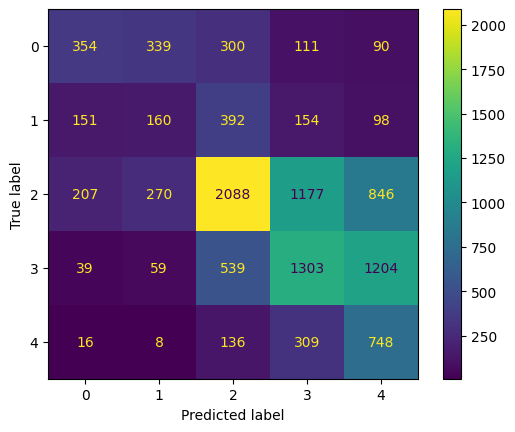

In [38]:
y_pred = KNN_model.predict(X_test)
evaluate_model(np.array(y_test), np.array(y_pred))

# Comparision ML performance

In [45]:
model_name = ['LogisticRegression', 'SVM', 'Gaussian NB', 'Categorical NB' ,'Multinomial NB', 'KNN', 'DecisionTree', 'RandomForest', 'XGB']
recall_score_test = []
recall_score_train = []
for i in [Logistic_model, SVM_model, model_GaussianNB, CategoricalNB_model, MultinomialNB_model, KNN_model, DecisionTree_model, RandomForest_model]:
    y_pred = i.predict(X_test)
    s = accuracy_score(y_test, y_pred)
    recall_score_test.append(s)

    y_pred = i.predict(X_train)
    s = accuracy_score(y_train, y_pred)
    recall_score_train.append(s)

# XGB model, cause I have to minus 1 in label
y_pred = XGB_model.predict(X_test)
recall_score_test.append(accuracy_score(y_test-1, y_pred))
y_pred = XGB_model.predict(X_train)
recall_score_train.append(accuracy_score(y_train-1, y_pred))

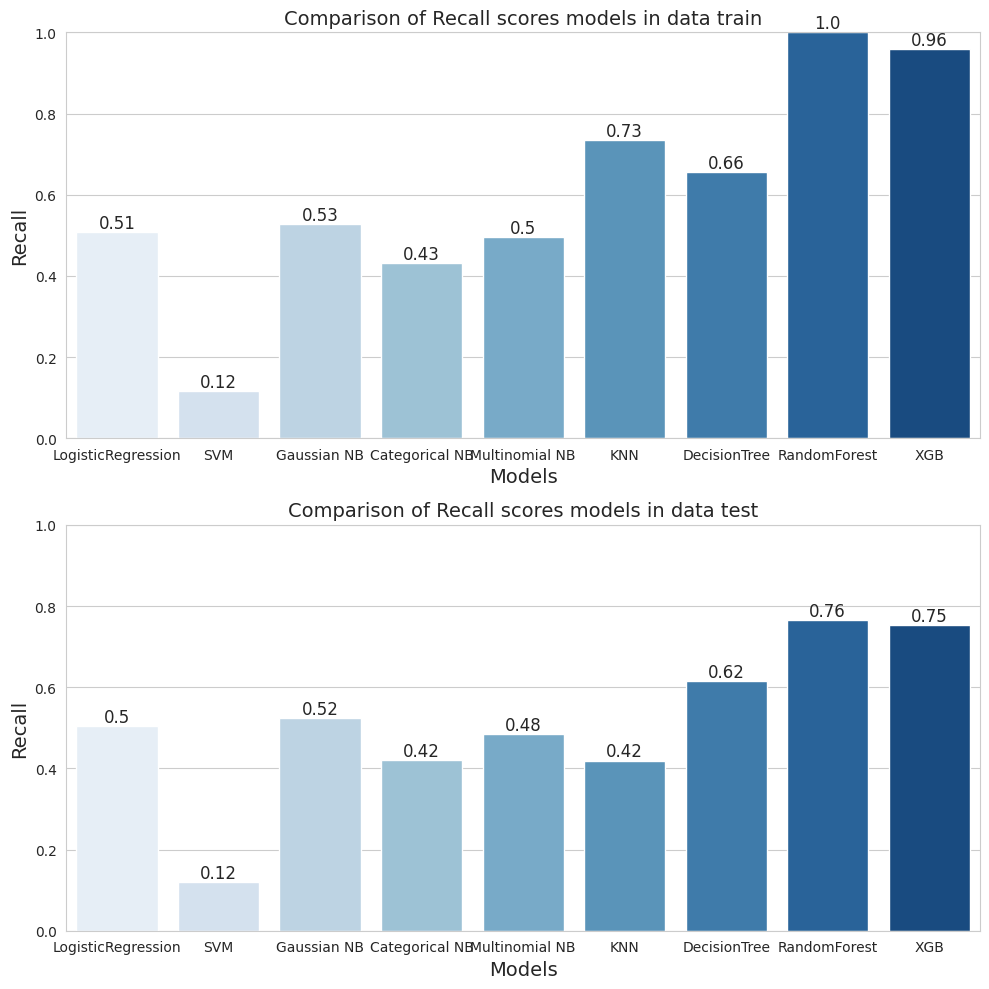

In [46]:
sns.set_style("whitegrid")
fig, ax = plt.subplots(nrows = 2, figsize = (10, 10))
sns.barplot(x=model_name, y=recall_score_train, ax = ax[0], palette="Blues")
ax[0].set_ylim(0, 1.0)

# add text labels to the bars
for i, score in enumerate(recall_score_train):
    ax[0].text(i, score+0.01, round(score, 2), ha='center', fontsize=12)

ax[0].set_title('Comparison of Recall scores models in data train', fontsize=14)
ax[0].set_xlabel('Models', fontsize=14)
ax[0].set_ylabel('Recall', fontsize=14)

sns.barplot(x=model_name, y=recall_score_test, ax = ax[1], palette="Blues")
ax[1].set_ylim(0, 1.0)

for i, score in enumerate(recall_score_test):
    ax[1].text(i, score+0.01, round(score, 2), ha='center', fontsize=12)

ax[1].set_title('Comparison of Recall scores models in data test', fontsize=14)
ax[1].set_xlabel('Models', fontsize=14)
ax[1].set_ylabel('Recall', fontsize=14)

plt.tight_layout()
plt.show()

# Model with feature engineer

## LogisticRegression

In [64]:
def build_model_LogisticRegression(X, y):
    scale = StandardScaler()
    scale.fit_transform(X)

    # Create the pipeline
    pipeline = Pipeline([
        ('scaler', StandardScaler()),
        ('classifier', LogisticRegression(multi_class='multinomial'))
    ])

    # Define the hyperparameters to tune and their potential values
    param_grid = {
        'classifier__C': [0.1, 1, 10],
        'classifier__solver': ['newton-cg', 'saga', 'sag', 'lbfgs']
    }
    model = GridSearchCV(pipeline, param_grid, scoring='recall_weighted', cv=5)
    model.fit(X, y)
    print(model.best_estimator_)
    return model

In [65]:
%%time
Logistic_model = build_model_LogisticRegression(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('classifier',
                 LogisticRegression(C=1, multi_class='multinomial',
                                    solver='saga'))])
CPU times: user 16.5 s, sys: 6.63 s, total: 23.1 s
Wall time: 19.3 s


accuracy 0.5173004144890971
precision 0.4506050775710467
recall 0.5173004144890971
F1 0.47553884181933787
Classification Report
               precision    recall  f1-score   support

           1       0.04      0.01      0.01       767
           2       0.00      0.00      0.00       836
           3       0.54      0.79      0.64      3455
           4       0.43      0.45      0.44      3054
           5       0.60      0.55      0.57      2986

    accuracy                           0.52     11098
   macro avg       0.32      0.36      0.33     11098
weighted avg       0.45      0.52      0.48     11098



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:13

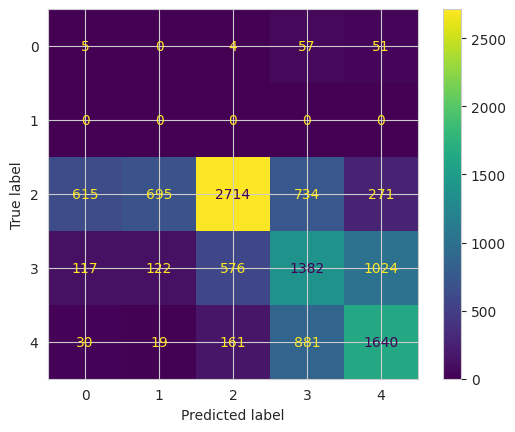

In [66]:
y_pred = Logistic_model.predict(X_test)
evaluate_model(np.array(y_test), np.array(y_pred))

## Complement NB


In [67]:
from sklearn.preprocessing import MinMaxScaler

def build_model_ComplementNB(X, y):

    pipe = Pipeline(steps=[("scale", MinMaxScaler()), ("NB", ComplementNB())], verbose=True)
    param_grid = {
        'NB__alpha': np.arange(0, 2.01, 0.05),
        'NB__fit_prior': [False, True],
        'NB__class_prior': [None],
        'NB__norm': [False]
    }
    model = GridSearchCV(pipe, param_grid, scoring='recall_weighted', n_jobs=4)
    model.fit(X, y)
    print(model.best_estimator_)
    return model

ComplementNB_model = build_model_ComplementNB(X_train, y_train)
ComplementNB_model

[Pipeline] ............. (step 1 of 2) Processing scale, total=   0.0s
[Pipeline] ................ (step 2 of 2) Processing NB, total=   0.0s
Pipeline(steps=[('scale', MinMaxScaler()),
                ('NB', ComplementNB(fit_prior=False))],
         verbose=True)


GridSearchCV(estimator=Pipeline(steps=[('scale', MinMaxScaler()),
                                       ('NB', ComplementNB())],
                                verbose=True),
             n_jobs=4,
             param_grid={'NB__alpha': array([0.  , 0.05, 0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35, 0.4 , 0.45, 0.5 ,
       0.55, 0.6 , 0.65, 0.7 , 0.75, 0.8 , 0.85, 0.9 , 0.95, 1.  , 1.05,
       1.1 , 1.15, 1.2 , 1.25, 1.3 , 1.35, 1.4 , 1.45, 1.5 , 1.55, 1.6 ,
       1.65, 1.7 , 1.75, 1.8 , 1.85, 1.9 , 1.95, 2.  ]),
                         'NB__class_prior': [None],
                         'NB__fit_prior': [False, True], 'NB__norm': [False]},
             scoring='recall_weighted')

accuracy 0.38412326545323483
precision 0.3026347713219732
recall 0.38412326545323483
F1 0.29455802343314136
Classification Report
               precision    recall  f1-score   support

           1       0.03      0.00      0.00       767
           2       0.00      0.00      0.00       836
           3       0.39      0.66      0.49      3455
           4       0.27      0.02      0.04      3054
           5       0.39      0.64      0.49      2986

    accuracy                           0.38     11098
   macro avg       0.22      0.26      0.20     11098
weighted avg       0.30      0.38      0.29     11098



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:13

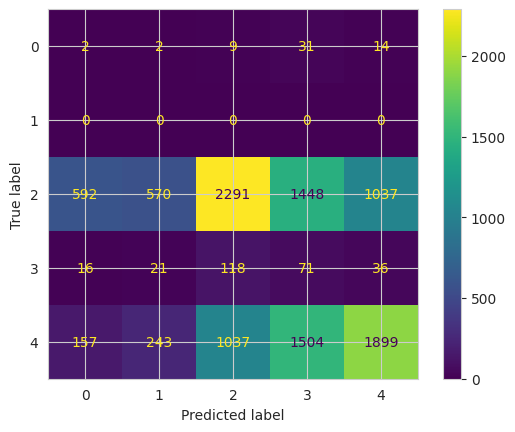

In [68]:
y_pred = ComplementNB_model.predict(X_test)
evaluate_model(np.array(y_test), np.array(y_pred))

## GaussianNB


In [69]:
def build_model_GaussianNB(X, y):
    pipe = Pipeline(steps=[("NB", GaussianNB())], verbose=True)
    param_grid = {
        'NB__var_smoothing': np.logspace(-1, -9, num=200)
    }
    model = GridSearchCV(pipe, param_grid, scoring='recall_weighted', n_jobs=3)
    model.fit(X, y)
    return model

model_GaussianNB = build_model_GaussianNB(X_train, y_train)
model_GaussianNB

[Pipeline] ................ (step 1 of 1) Processing NB, total=   0.0s


GridSearchCV(estimator=Pipeline(steps=[('NB', GaussianNB())], verbose=True),
             n_jobs=3,
             param_grid={'NB__var_smoothing': array([1.00000000e-01, 9.11588830e-02, 8.30994195e-02, 7.57525026e-02,
       6.90551352e-02, 6.29498899e-02, 5.73844165e-02, 5.23109931e-02,
       4.76861170e-02, 4.34701316e-02, 3.96268864e-02, 3.61234270e-02,
       3.29297126e-02, 3.00183581e-02, 2.73644000e-02, 2.4...
       8.40665289e-09, 7.66341087e-09, 6.98587975e-09, 6.36824994e-09,
       5.80522552e-09, 5.29197874e-09, 4.82410870e-09, 4.39760361e-09,
       4.00880633e-09, 3.65438307e-09, 3.33129479e-09, 3.03677112e-09,
       2.76828663e-09, 2.52353917e-09, 2.30043012e-09, 2.09704640e-09,
       1.91164408e-09, 1.74263339e-09, 1.58856513e-09, 1.44811823e-09,
       1.32008840e-09, 1.20337784e-09, 1.09698580e-09, 1.00000000e-09])},
             scoring='recall_weighted')

accuracy 0.5378446566949
precision 0.4895861998807215
recall 0.5378446566949
F1 0.49697254034855803
Classification Report
               precision    recall  f1-score   support

           1       0.04      0.01      0.01       767
           2       0.00      0.00      0.00       836
           3       0.55      0.76      0.64      3455
           4       0.46      0.65      0.54      3054
           5       0.70      0.46      0.55      2986

    accuracy                           0.54     11098
   macro avg       0.35      0.37      0.35     11098
weighted avg       0.49      0.54      0.50     11098



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:13

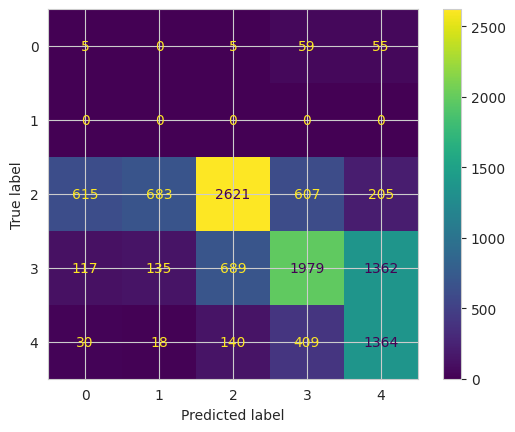

In [70]:
y_pred = model_GaussianNB.predict(X_test)
evaluate_model(np.array(y_test), np.array(y_pred))

## CategoricalNB

In [71]:
def build_model_CategoricalNB(X, y):
    pipe = Pipeline(steps=[("scale", MinMaxScaler()), ("NB", CategoricalNB())], verbose=True)

    param_grid = {
        'NB__alpha': np.arange(0.1, 5.01, 0.05),
        'NB__force_alpha': [False, True]
    }
    model = GridSearchCV(pipe, param_grid, scoring="recall_weighted", n_jobs=2)
    model.fit(X, y)

    return model

CategoricalNB_model = build_model_CategoricalNB(X_train, y_train)
CategoricalNB_model

[Pipeline] ............. (step 1 of 2) Processing scale, total=   0.0s
[Pipeline] ................ (step 2 of 2) Processing NB, total=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
  warnings.warn(


GridSearchCV(estimator=Pipeline(steps=[('scale', MinMaxScaler()),
                                       ('NB', CategoricalNB())],
                                verbose=True),
             n_jobs=2,
             param_grid={'NB__alpha': array([0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35, 0.4 , 0.45, 0.5 , 0.55, 0.6 ,
       0.65, 0.7 , 0.75, 0.8 , 0.85, 0.9 , 0.95, 1.  , 1.05, 1.1 , 1.15,
       1.2 , 1.25, 1.3 , 1.35, 1.4 , 1.45, 1.5 , 1.55, 1.6 , 1.65, 1.7 ,
       1.75, 1.8 , 1.85, 1.9 , 1.95, 2.  , 2.05, 2.1 , 2.15, 2.2 , 2.25,
       2.3 , 2.35, 2.4 , 2.45, 2.5 , 2.55, 2.6 , 2.65, 2.7 , 2.75, 2.8 ,
       2.85, 2.9 , 2.95, 3.  , 3.05, 3.1 , 3.15, 3.2 , 3.25, 3.3 , 3.35,
       3.4 , 3.45, 3.5 , 3.55, 3.6 , 3.65, 3.7 , 3.75, 3.8 , 3.85, 3.9 ,
       3.95, 4.  , 4.05, 4.1 , 4.15, 4.2 , 4.25, 4.3 , 4.35, 4.4 , 4.45,
       4.5 , 4.55, 4.6 , 4.65, 4.7 , 4.75, 4.8 , 4.85, 4.9 , 4.95, 5.  ]),
                         'NB__force_alpha': [False, True]},
             scoring='recall_weighted')

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:13

accuracy 0.3114074608037484
precision 0.17225611704374014
recall 0.3114074608037484
F1 0.14800867514992833
Classification Report
               precision    recall  f1-score   support

           1       0.00      0.00      0.00       767
           2       1.00      0.00      0.00       836
           3       0.31      1.00      0.47      3455
           4       0.00      0.00      0.00      3054
           5       0.00      0.00      0.00      2986

    accuracy                           0.31     11098
   macro avg       0.26      0.20      0.10     11098
weighted avg       0.17      0.31      0.15     11098



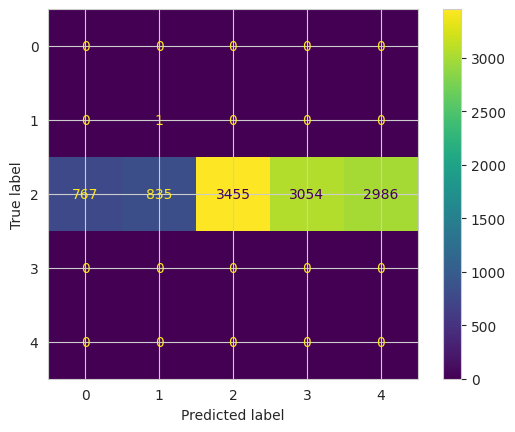

In [72]:
y_pred = CategoricalNB_model.predict(X_test)
evaluate_model(np.array(y_test), np.array(y_pred))

## MultinomialNB


In [73]:
def build_model_MultinomialNB(X, y):
    pipe = Pipeline(steps=[("scale", MinMaxScaler()), ("NB", MultinomialNB())], verbose=True)
    param_grid = {
        'NB__alpha': np.arange(0.1, 5.01, 0.05),
        'NB__fit_prior': [False, True]
    }

    model = GridSearchCV(pipe, param_grid, scoring="recall_weighted", n_jobs=2)
    model.fit(X, y)

    return model

In [74]:
%%time
MultinomialNB_model = build_model_MultinomialNB(X_train, y_train)

[Pipeline] ............. (step 1 of 2) Processing scale, total=   0.0s
[Pipeline] ................ (step 2 of 2) Processing NB, total=   0.0s
CPU times: user 1.39 s, sys: 154 ms, total: 1.54 s
Wall time: 15 s


accuracy 0.3121283114074608
precision 0.35823343037483996
recall 0.3121283114074608
F1 0.1735205567253363
Classification Report
               precision    recall  f1-score   support

           1       0.00      0.00      0.00       767
           2       0.00      0.00      0.00       836
           3       0.31      0.95      0.47      3455
           4       0.31      0.05      0.08      3054
           5       0.66      0.01      0.02      2986

    accuracy                           0.31     11098
   macro avg       0.26      0.20      0.11     11098
weighted avg       0.36      0.31      0.17     11098



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:13

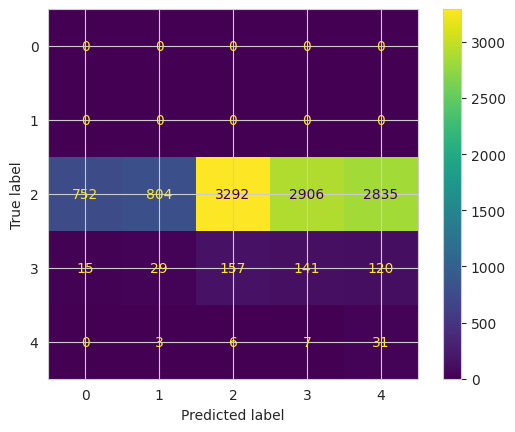

In [75]:
y_pred = MultinomialNB_model.predict(X_test)
evaluate_model(np.array(y_test), np.array(y_pred))

## Random Forest

In [ ]:
def build_model_RandomForest(X, y):

    pipe = Pipeline(steps=[ ("tree", RandomForestClassifier(random_state = 42, n_jobs = -1))], verbose = True)
    param_grid = {
        'tree__n_estimators': [1, 5, 20, 50, 300, None],
        'tree__criterion': ['gini', 'entropy', 'log_loss'],
        'tree__max_features': [None, 'auto', 'sqrt', 'log2']
    }
    model = GridSearchCV(pipe, param_grid, scoring = 'recall_weighted', n_jobs = -1)
    model.fit(X, y)

    return model

In [ ]:
%%time
RandomForest_model = build_model_RandomForest(X_train,y_train)

/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
60 fits failed out of a total of 360.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
60 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py

[Pipeline] .............. (step 1 of 1) Processing tree, total= 1.2min
CPU times: user 2min 18s, sys: 1.6 s, total: 2min 19s
Wall time: 31min 48s


accuracy 0.7649125968642999
precision 0.771770733566392
recall 0.7649125968642999
F1 0.7627320632279871
Classification Report
               precision    recall  f1-score   support

           1       0.68      0.88      0.77       767
           2       0.84      0.66      0.74       836
           3       0.91      0.85      0.88      3455
           4       0.69      0.58      0.63      3054
           5       0.70      0.86      0.77      2986

    accuracy                           0.76     11098
   macro avg       0.76      0.77      0.76     11098
weighted avg       0.77      0.76      0.76     11098



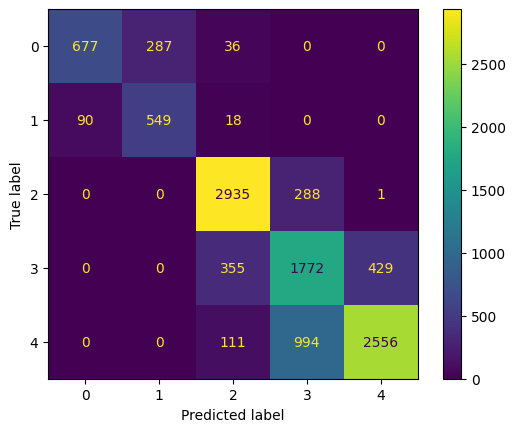

In [ ]:
y_pred = RandomForest_model.predict(X_test)
evaluate_model(np.array(y_test), np.array(y_pred))

## SVM Classification

In [ ]:
def build_model_SVM(X, y):
    pipe = Pipeline(steps=[ ("SVM", SVC(random_state = 42, max_iter = 1000))], verbose = True)

    param_grid = {
        'SVM__C': [1, 1e3, 1e6],
        'SVM__kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
        'SVM__degree': [1, 2, 3, 4, 5]
        }
    model = GridSearchCV(pipe, param_grid, scoring = 'recall', n_jobs = 3)
    model.fit(X, y)

    return model

In [ ]:
%%time
SVM_model = build_model_SVM(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan]
  warnings.warn(


[Pipeline] ............... (step 1 of 1) Processing SVM, total=   1.7s
CPU times: user 22.1 s, sys: 2.49 s, total: 24.6 s
Wall time: 1h 3min 26s


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


accuracy 0.5704631465128852
precision 0.5753063520703117
recall 0.5704631465128852
F1 0.5378723816699248
Classification Report
               precision    recall  f1-score   support

           1       0.81      0.22      0.35       767
           2       0.00      0.00      0.00       836
           3       0.59      0.76      0.67      3455
           4       0.47      0.73      0.57      3054
           5       0.77      0.43      0.55      2986

    accuracy                           0.57     11098
   macro avg       0.53      0.43      0.43     11098
weighted avg       0.58      0.57      0.54     11098



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:13

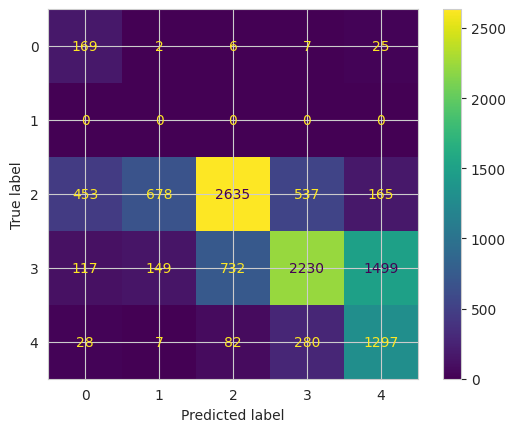

In [91]:
y_pred = SVM_model.predict(X_test)
evaluate_model(np.array(y_test), np.array(y_pred))

## Decision Tree Classification

In [79]:
def build_model_DecisionTree(X, y):

    pipe = Pipeline(steps=[ ("tree", DecisionTreeClassifier(random_state = 42))], verbose = True)
    param_grid = {
        'tree__criterion': ['gini', 'entropy', 'log_loss'],
        'tree__max_depth': [10, 20, 50, 100, 200, 300, None],
        'tree__min_samples_leaf': [1, 2, 3, 4, 5],
        'tree__max_features': ['auto', 'sqrt', 'log2', 'None']
        }
    model = GridSearchCV(pipe, param_grid, scoring = 'recall', n_jobs = 4)
    model.fit(X, y)

    return model

In [80]:
%%time
DecisionTree_model = build_model_DecisionTree(X_train, y_train)

[Pipeline] .............. (step 1 of 1) Processing tree, total=   0.1s
CPU times: user 9.46 s, sys: 989 ms, total: 10.5 s
Wall time: 3min 59s


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
525 fits failed out of a total of 2100.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
306 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 405, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py", line 889, in fit
    super().fit(
  File "/usr/local/lib/python3.10/dist-packages/sklearn

accuracy 0.5932600468552892
precision 0.5859963026688542
recall 0.5932600468552892
F1 0.5624033100916991
Classification Report
               precision    recall  f1-score   support

           1       0.82      0.37      0.51       767
           2       0.09      0.00      0.01       836
           3       0.57      0.83      0.67      3455
           4       0.55      0.68      0.61      3054
           5       0.73      0.45      0.56      2986

    accuracy                           0.59     11098
   macro avg       0.55      0.47      0.47     11098
weighted avg       0.59      0.59      0.56     11098



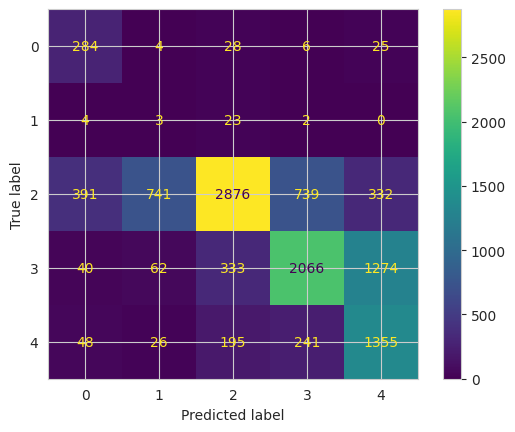

In [81]:
y_pred = DecisionTree_model.predict(X_test)
evaluate_model(np.array(y_test), np.array(y_pred))

## XGB Classification

In [ ]:
def build_model_XGB(X, y):

    pipe = Pipeline(steps=[ ("tree", XGBClassifier(objective="multi:softmax", random_state = 42, n_jobs = -1, booster = 'gbtree'))],\
                    verbose = True)
    param_grid = {
        "tree__n_estimators": [50, 100, 200],
        "tree__learning_rate": [1, 1e-3],
        "tree__max_depth": np.arange(3, 11, 1),
        }
    model = GridSearchCV(pipe, param_grid, scoring = 'recall', n_jobs = 3)
    model.fit(X, y)

    return model

In [83]:
%%time
XGB_model = XGBClassifier().fit(X_train, y_train-1)

CPU times: user 41.8 s, sys: 90.9 ms, total: 41.9 s
Wall time: 35.1 s


accuracy 0.5993872769868445
precision 0.5867457949855763
recall 0.5993872769868445
F1 0.5724397754629698
Classification Report
               precision    recall  f1-score   support

           0       0.79      0.38      0.51       767
           1       0.14      0.01      0.02       836
           2       0.60      0.80      0.69      3455
           3       0.53      0.69      0.60      3054
           4       0.70      0.50      0.59      2986

    accuracy                           0.60     11098
   macro avg       0.55      0.47      0.48     11098
weighted avg       0.59      0.60      0.57     11098



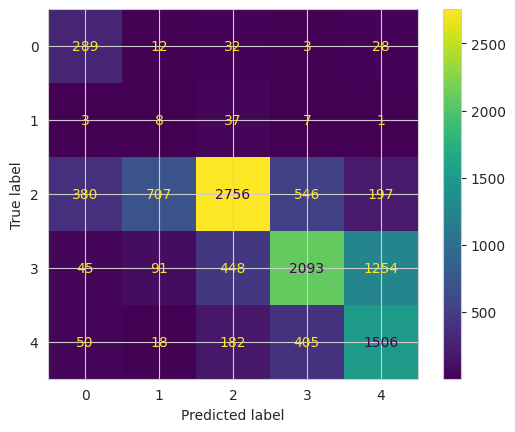

In [84]:
y_pred = XGB_model.predict(X_test)
evaluate_model(np.array(y_test-1), np.array(y_pred))

## KNN

In [76]:
def build_model_KNN(X, y):
  # Định nghĩa các giá trị siêu tham số cho model KNN
  param_grid = {'n_neighbors': list(range(2, 10)),
                'weights': ['uniform', 'distance'],
                'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute']
                }
  # Sử dụng GridSearchCV để tìm kiếm siêu tham số tốt nhất cho model
  model = GridSearchCV(KNeighborsClassifier(), param_grid, scoring='recall')
  model.fit(X, y)
  return model

In [77]:
%%time
KNN_model = build_model_KNN(X_train, y_train)

Streaming output truncated to the last 5000 lines.

  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 282, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py", line 2098, in recall_score
    _, r, _, _ = precision_recall_fscore_support(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py

CPU times: user 2min 5s, sys: 670 ms, total: 2min 5s
Wall time: 1min 43s


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 282, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py", line 2098, in recall_score
    _, r, _, _ = precision_recall_fscore_support(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py", line 1573, in precision_recall_fscore_support
    labels = _check_

accuracy 0.45954225986664266
precision 0.5129948858976
recall 0.45954225986664266
F1 0.47050543604502115
Classification Report
               precision    recall  f1-score   support

           1       0.28      0.48      0.36       767
           2       0.15      0.25      0.19       836
           3       0.47      0.48      0.48      3455
           4       0.53      0.56      0.54      3054
           5       0.71      0.38      0.50      2986

    accuracy                           0.46     11098
   macro avg       0.43      0.43      0.41     11098
weighted avg       0.51      0.46      0.47     11098



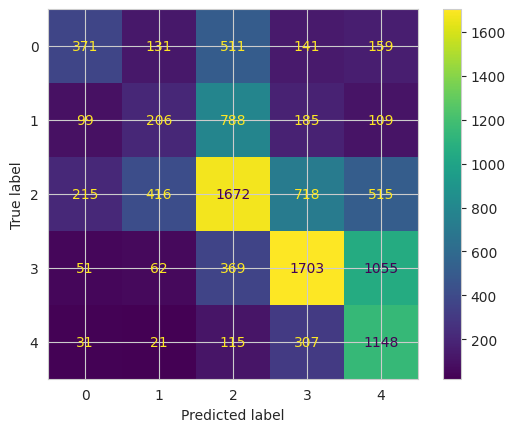

In [78]:
y_pred = KNN_model.predict(X_test)
evaluate_model(np.array(y_test), np.array(y_pred))

## Comparision ML performance

In [89]:
model_name = ['LogisticRegression', 'SVM', 'Gaussian NB', 'Categorical NB' ,'Multinomial NB', 'KNN', 'DecisionTree', 'RandomForest', 'XGB']
recall_score_test = []
recall_score_train = []
for i in [Logistic_model, SVM_model, model_GaussianNB, CategoricalNB_model, MultinomialNB_model, KNN_model, DecisionTree_model, RandomForest_model]:
    y_pred = i.predict(X_test)
    s = accuracy_score(y_test, y_pred)
    recall_score_test.append(s)

    y_pred = i.predict(X_train)
    s = accuracy_score(y_train, y_pred)
    recall_score_train.append(s)

# XGB model, cause I have to minus 1 in label
y_pred = XGB_model.predict(X_test)
recall_score_test.append(accuracy_score(y_test-1, y_pred))
y_pred = XGB_model.predict(X_train)
recall_score_train.append(accuracy_score(y_train-1, y_pred))

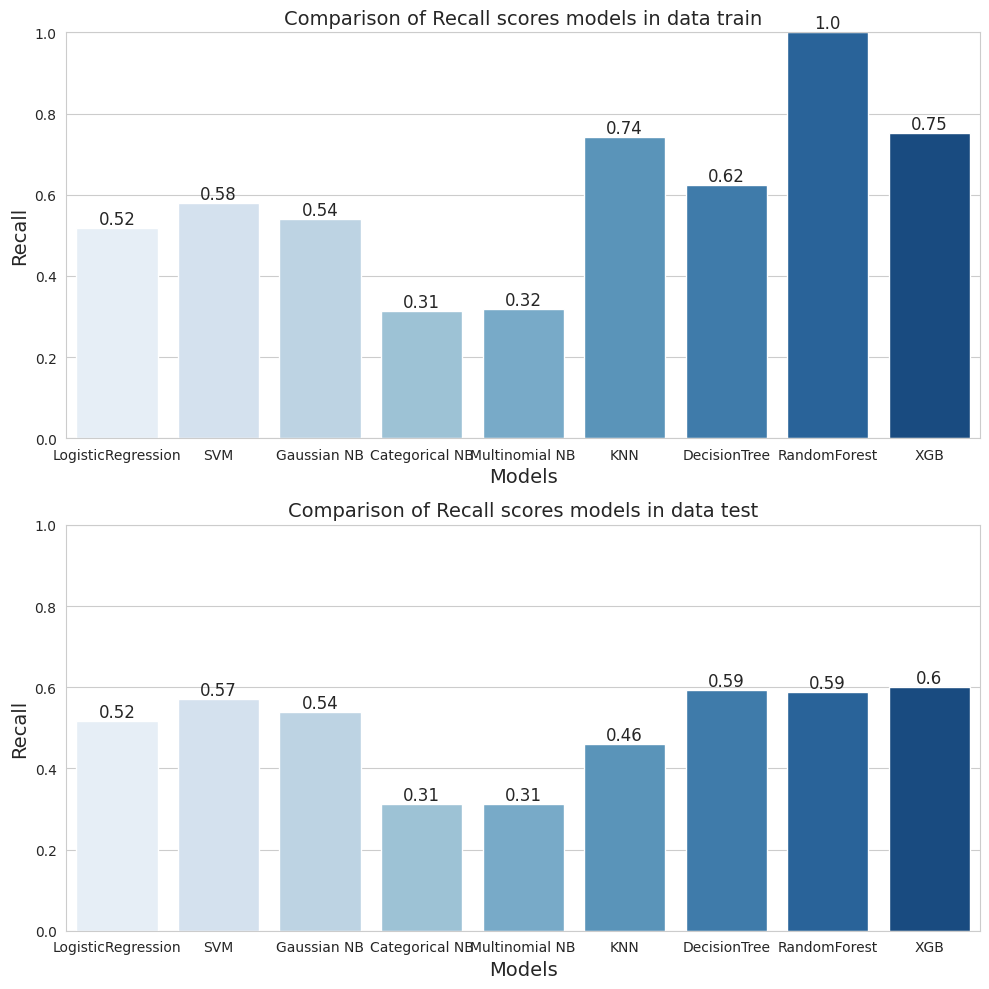

In [90]:
sns.set_style("whitegrid")
fig, ax = plt.subplots(nrows = 2, figsize = (10, 10))
sns.barplot(x=model_name, y=recall_score_train, ax = ax[0], palette="Blues")
ax[0].set_ylim(0, 1.0)

# add text labels to the bars
for i, score in enumerate(recall_score_train):
    ax[0].text(i, score+0.01, round(score, 2), ha='center', fontsize=12)

ax[0].set_title('Comparison of Recall scores models in data train', fontsize=14)
ax[0].set_xlabel('Models', fontsize=14)
ax[0].set_ylabel('Recall', fontsize=14)

sns.barplot(x=model_name, y=recall_score_test, ax = ax[1], palette="Blues")
ax[1].set_ylim(0, 1.0)

for i, score in enumerate(recall_score_test):
    ax[1].text(i, score+0.01, round(score, 2), ha='center', fontsize=12)

ax[1].set_title('Comparison of Recall scores models in data test', fontsize=14)
ax[1].set_xlabel('Models', fontsize=14)
ax[1].set_ylabel('Recall', fontsize=14)

plt.tight_layout()
plt.show()

# Conclusion (D)

This dataset have a lots problems like and we plan to process it:
* age, membership_category (ordinal), internet_option, used_special_discount, offer_application_preference, past_complaint, complaint_status: kinda good
* Drop columns: customer_id, Name, security_no, referral_id - not necessary
---
* Gender: 59 Unknown, not correlate with another columns => mode imputation.
* region_category: 3 categorical values, missing 5428 => mode imputation.
* joining_date: 1096 distinct values =>  split 3 features year - month - day.
* joined_through_referral: Yes, No, '?' occupy 14,7% (error value) => impute mode (No)
* preferred_offer_types: missing 288 => mode imputation.
* medium_of_operation:  3 categorical values + 14.6% '?' value => mode imputation.
* last_visit_time => 30101 distinct values => split 3 features hour - minute - second

* days_since_last_login: outlier, left-skewed, 2k negative values => impute negative values = median
---
* avg_time_spent: outlier, right-skewed, 1719 negative values =>> impute median

* avg_transaction_value: outlier => impute 5% = median

* avg_frequency_login_days: 3522 error value => change into mean or median, change type numeric then EDA again

* points_in_wallet: missing 3443, 136 negative, outlier 5% => impute mean

* feedback: high cardinality (not much 9 distinct value) => change values have frequency < 5% into 'Others' value
---
* churn_risk_score: range values according to rate of churn rate and have error value (-1), cause its correlation with feedback (about 0.5 in pandas_profiling) so we check frequency of values feecback following churn_risk_score values. We saw that churn_risk_score = 1, 2 feedback is positive, churn_risk_score = 3, 4, 5 feedback is negative and when churn_risk_score = -1 feedback is much more negative than positive => we decide to replace -1 by 3

---
* Recall is main metric because it's preferable to have a model that does not miss any churns but sometimes classify a non-churns as churns, than a model that does not classify non-churns as churns but misses a lot of churns. In other words, we prefer to be incorrect when classifying a non-churning costumer than when classifying a churning customer.

* We don't use cross-validation to tuning model cause google colab will crash so we only use holdout (train_test_split) method

* We have experimented many feature engineer techniques and Machine Learning Algorithm as possible but seem likes, dataset with only preprocessing and encode (categorical features) have highest performane with RandomForest and XGB

Main model: RandomForest